In [ ]:
from functions_data import *

In [2]:
# Predefined formating of plots
set_academic_style()

# Data Preparation

In [3]:
# Raw ESTR OIS data import (as exported from Bloomberg)
df_raw = pd.read_csv('ESTR_OIS_20260115.csv', sep=';')
df_raw.head()

,Term,Unit,Ticker,Bid,Ask,Bid Spr Val,Ask Spr Val,Final Bid Rate,Final Ask Rate,Rate Type,Daycount,Freq
0,1,WK,EESWE1Z,"1,931871533","1,934528232",0,0,"1,931871533","1,934528232",Swap Rates,ACT/360,1
1,2,WK,EESWE2Z,"1,931084871","1,932915211",0,0,"1,931084871","1,932915211",Swap Rates,ACT/360,1
2,1,MO,EESWEA,"1,932157397","1,934542537",0,0,"1,932157397","1,934542537",Swap Rates,ACT/360,1
3,2,MO,EESWEB,"1,932902217","1,935397744",0,0,"1,932902217","1,935397744",Swap Rates,ACT/360,1
4,3,MO,EESWEC,"1,932728529","1,935271502",0,0,"1,932728529","1,935271502",Swap Rates,ACT/360,1


In [10]:
# Create a single Tenor columns
df_raw['Tenor'] = df_raw['Term'].astype('str') + df_raw['Unit']

# Select relevant columns
df = df_raw[['Tenor', 'Bid', 'Ask']].copy()
df[['Bid', 'Ask']] = df[['Bid', 'Ask']].replace(',', '.', regex=True).astype(float)
df['Mid'] = np.round((df['Bid'] + df['Ask']) / 2, 6)

print(df.head())

  Tenor       Bid       Ask      Mid
0   1WK  1.931872  1.934528  1.93320
1   2WK  1.931085  1.932915  1.93200
2   1MO  1.932157  1.934543  1.93335
3   2MO  1.932902  1.935398  1.93415
4   3MO  1.932729  1.935272  1.93400


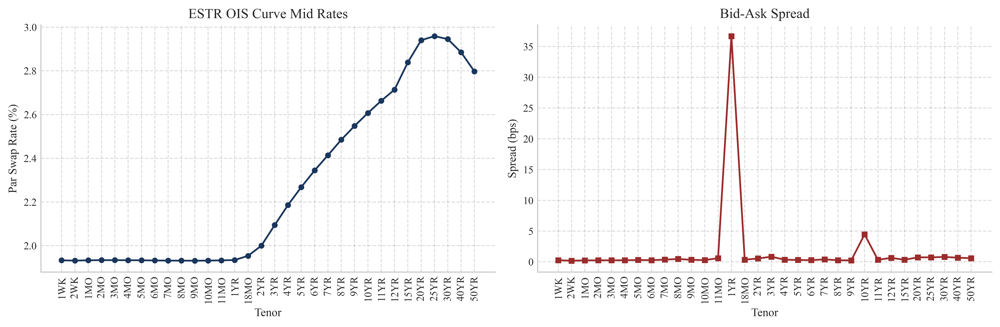

In [ ]:
# Plot imported curve with Bid-Ask spreads

fig, ax = plt.subplots(1, 2, figsize=(12, 4), dpi=500)

color_mid = '#1a365d'
color_spread = '#9b2c2c'

# -- Plot 1: Mid Rates --
ax[0].plot(df['Tenor'], df['Mid'], marker='o', markersize=4, color=color_mid, lw=1.5)
ax[0].set_title('ESTR OIS Curve Mid Rates')
ax[0].set_ylabel('Par Swap Rate (%)')

# -- Plot 2: Bid-Ask Spread --
spread_bps = 100 * abs(df['Bid'] - df['Ask'])
ax[1].plot(df['Tenor'], spread_bps, marker='s', markersize=4, color=color_spread, lw=1.5)
ax[1].set_title('Bid-Ask Spread')
ax[1].set_ylabel('Spread (bps)')

# -- Formatting --
for a in ax:
    a.set_xlabel('Tenor')
    a.grid(True, alpha=0.3, linestyle='--')
    
    a.spines['top'].set_visible(False)
    a.spines['right'].set_visible(False)
    
    a.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

In [ ]:
# Define anchor dates
# Trade Date: Thursday, Jan 15, 2026
# OIS Spot/Settlement Date (T+2): Monday, Jan 19, 2026
spot_date = pd.to_datetime("2026-01-19")

# Generate dates and ACT/360 fractions
df['Maturity_Date'] = df['Tenor'].apply(lambda x: calculate_maturity(spot_date, x))
df['Actual_Days'] = (df['Maturity_Date'] - spot_date).dt.days
df['T'] = df['Actual_Days'] / 360

# Standardise the MID for the wide 1Y spread
# -- Blank out the corrupted 1YR quote with NaN --
df.loc[df['Tenor'] == '1YR', 'Mid'] = np.nan

# -- Temporarily set 'T' (your ACT/360 fraction) as the index --
df_temp = df.set_index('T')

# -- Interpolate dynamically with respect to time (index) --
df_temp['Mid'] = df_temp['Mid'].interpolate(method='index')

# -- Reset the index back to normal --
df = df_temp.reset_index()

print(df.head())

          T Tenor       Bid       Ask      Mid Maturity_Date  Actual_Days
0  0.019444   1WK  1.931872  1.934528  1.93320    2026-01-26            7
1  0.038889   2WK  1.931085  1.932915  1.93200    2026-02-02           14
2  0.086111   1MO  1.932157  1.934543  1.93335    2026-02-19           31
3  0.163889   2MO  1.932902  1.935398  1.93415    2026-03-19           59
4  0.252778   3MO  1.932729  1.935272  1.93400    2026-04-20           91


# Curve Bootstrapping

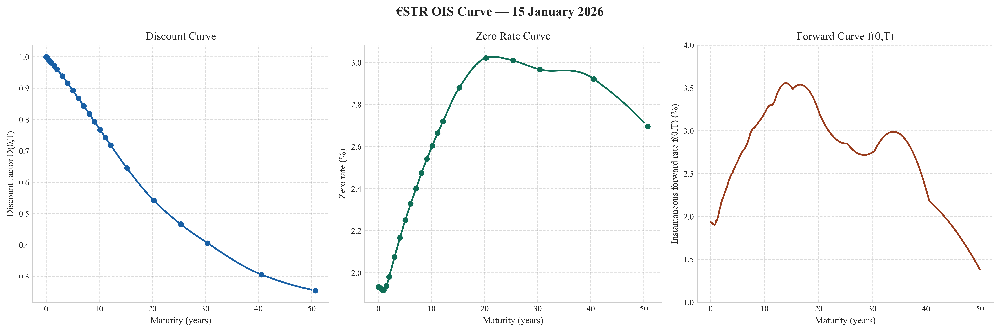

In [ ]:
ois_curve = bootstrap_ois_curve_act360(df, spot_date)
fine_curve = forward_curve(ois_curve, max_T=50.0)
plot_ois_curves(ois_curve, fine_curve)

# Calibration

In [22]:
market_bachelier_raw = pd.read_csv('vcub.csv', index_col=0)
market_bachelier_raw.index = market_bachelier_raw.index.str.upper()
market_bachelier_raw.columns = market_bachelier_raw.columns.str.upper()
market_bachelier_decimal = market_bachelier_raw / 10000.0

calibration_presets = {
    'baseline': {
        'expiries': ['1MO', '3MO', '6MO', '9MO', '1YR', '2YR', '3YR', '4YR', '5YR', '6YR', '7YR', '8YR', '9YR', '10YR', '12YR', '15YR', '20YR', '25YR', '30YR'],
        'tenors': ['2YR', '4YR', '10YR', '20YR', '25YR', '30YR'],
        'expiry_prefix': 'baseline'
    },
    'short': {
        'expiries': ['1MO', '3MO', '6MO', '9MO', '1YR'],
        'tenors': ['2YR', '3YR', '4YR', '5YR', '10YR', '20YR', '25YR', '30YR'],
        'expiry_prefix': 'short_1M_to_1Y'
    },
    'medium': {
        'expiries': ['1YR', '2YR', '3YR', '4YR', '5YR', '6YR', '7YR', '8YR', '9YR', '10YR'],
        'tenors': ['2YR', '3YR', '10YR', '15YR', '20YR', '25YR', '30YR'],
        'expiry_prefix': 'medium_1Y_to_10Y'
    },
    'long': {
        'expiries': ['5YR', '6YR', '7YR', '8YR', '9YR', '10YR', '12YR', '15YR', '20YR', '25YR', '30YR'],
        'tenors': ['2YR', '10YR', '12YR', '15YR', '20YR'],
        'expiry_prefix': 'long_5Y_to_30Y'
    }
}

preset = calibration_presets['medium']
target_expiries = preset['expiries']
target_tenors = preset['tenors']

market_target_vols = market_bachelier_decimal.loc[target_expiries, target_tenors]

rates_df, annuity_df, detailed_results = generate_forward_rates_annuity_grid_act360(pillar_df=ois_curve_ex1y, spot_date=spot_date, expiries=target_expiries, tenors=target_tenors)

--- Starting 3-Factor Calibration (Equal Weights) ---
Phase 1: Coarse Search (50 Latin Hypercube points)
Best initial guess found with SSE: 1.700203e-02
Phase 2: Gradient-Based Precision Refinement
Refined SSE: 3.591381e-04
--- Calibration Successful! ---

Final Calibrated Parameters:
  Factor 1 | Kappa: 0.0477 | Sigma: 278.59 bps
  Factor 2 | Kappa: 2.7390 | Sigma: 0.10 bps
  Factor 3 | Kappa: 0.0001 | Sigma: 129.86 bps
----------------------------------------



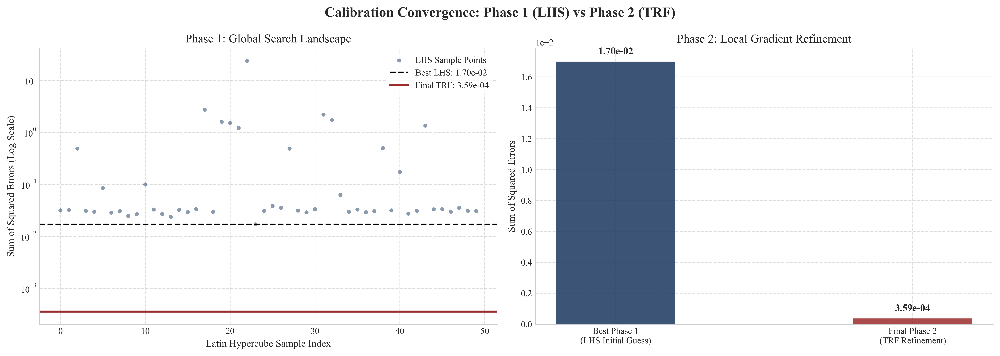

In [16]:
# 0. Calibration setup
n_factors = 3
lower_bounds = [1e-4] * n_factors + [1e-5] * n_factors # [kappa_1, ..., kappa_n, sigma_1, ..., sigma_n]
upper_bounds = [5.0] * n_factors + [1.0] * n_factors # upper_bounds = [kappa_1, ..., kappa_n, sigma_1, ..., sigma_n]

# 1. Coarse search via Latin Hypercube Sampling 
best_guess, initial_sse, lhs_history = calibration_1_lhs(
    bounds = (lower_bounds, upper_bounds), 
    detailed_results = detailed_results, 
    market_target_vols = market_target_vols, 
    num_initial_guesses=50, use_vega=False
)

# 2. Refinement LS-TRF
opt_res_equal, params_equal, vols_equal = calibration_2_trf(
    best_guess,
    bounds = (lower_bounds, upper_bounds), 
    detailed_results = detailed_results, 
    market_target_vols = market_target_vols, use_vega=False)

plot_calibration_convergence(lhs_history, opt_res_equal)

--- Starting 3-Factor Calibration (Vega Weights) ---
Phase 1: Coarse Search (50 Latin Hypercube points)
Best initial guess found with SSE: 1.851308e+00
Phase 2: Gradient-Based Precision Refinement
Refined SSE: 6.796328e-03
--- Calibration Successful! ---

Final Calibrated Parameters:
  Factor 1 | Kappa: 0.0001 | Sigma: 164.28 bps
  Factor 2 | Kappa: 0.1389 | Sigma: 555.01 bps
  Factor 3 | Kappa: 0.0003 | Sigma: 0.10 bps
----------------------------------------



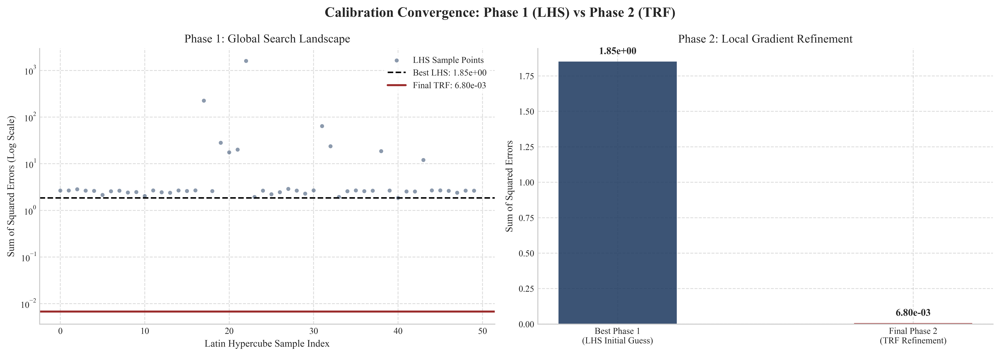

In [17]:
# Define Vega weights
vega_weights_matrix = extract_vega_weights(detailed_results, market_target_vols)

# 1. Coarse search via Latin Hypercube Sampling 
best_guess_vega, initial_sse_vega, lhs_history_vega = calibration_1_lhs(
    bounds = (lower_bounds, upper_bounds), 
    detailed_results = detailed_results, 
    market_target_vols = market_target_vols, 
    num_initial_guesses=50, use_vega=True
)

# 2. Refinement LS-TRF
opt_result_vega, params_vega, vols_vega = calibration_2_trf(
    best_guess,
    bounds = (lower_bounds, upper_bounds), 
    detailed_results = detailed_results, 
    market_target_vols = market_target_vols, use_vega=True)

plot_calibration_convergence(lhs_history_vega, opt_result_vega)

 PERFORMANCE SUMMARY: MEDIUM_1Y_TO_10Y
      Equal MAE  Vega MAE  Equal RMSE  Vega RMSE
2YR       25.51     80.39       29.66     105.18
3YR       15.42     50.32       18.92      66.52
10YR      28.06     12.60       34.49      13.96
15YR      18.29      8.41       21.63       9.48
20YR      11.59      5.13       15.61       6.38
25YR       8.32      5.10       12.63       6.34
30YR      13.61      9.43       17.10      11.50
------------------------------------------------------------
Global Surface Mean | Equal MAE: 17.26 bps | Vega MAE: 24.48 bps
Global Surface Mean | Equal RMSE: 21.44 bps | Vega RMSE: 31.34 bps



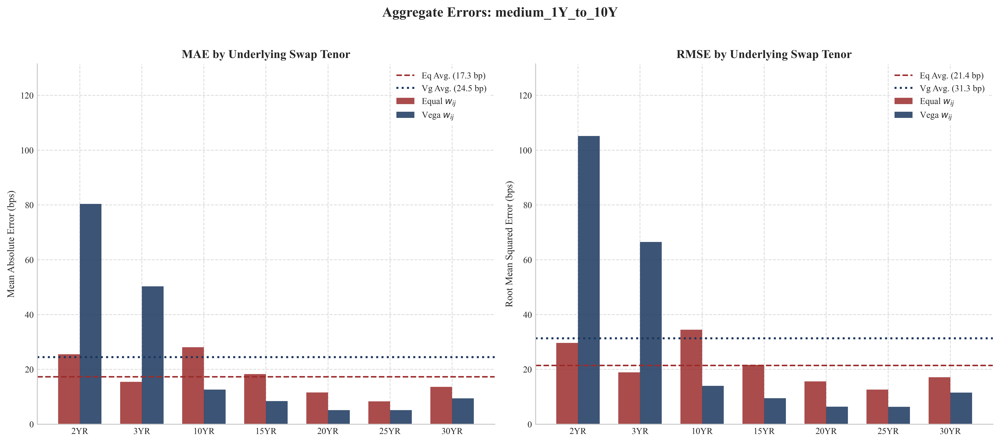

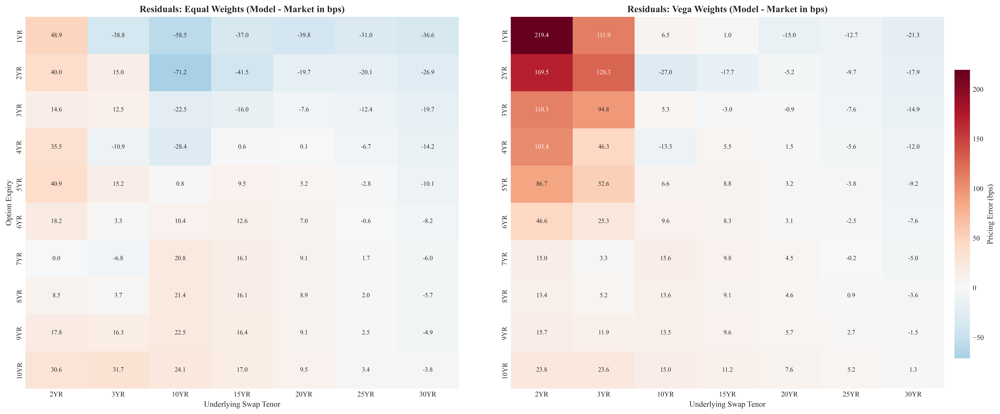

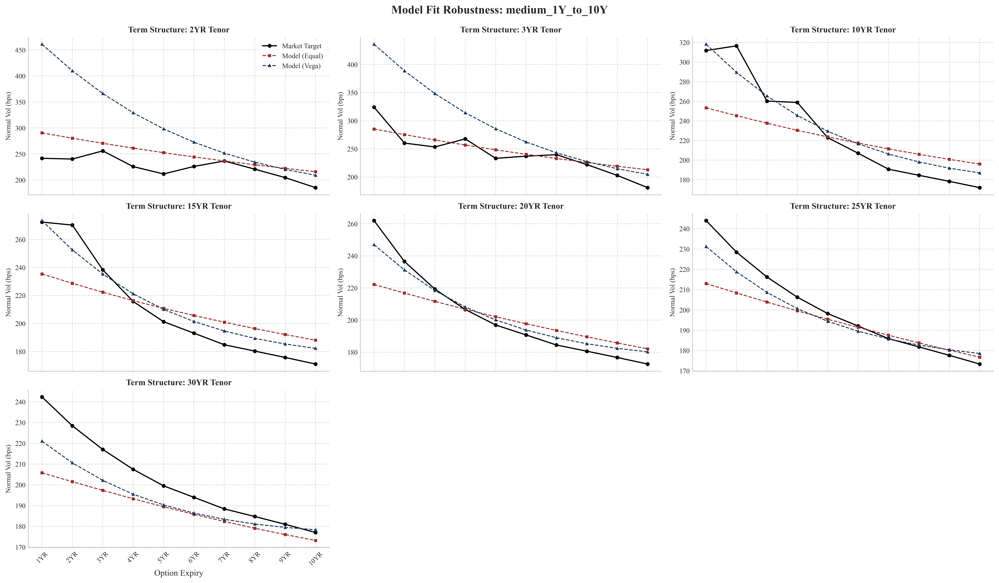

In [23]:
error_metrics_summary = plot_calibration_error(
    market_target_vols=market_target_vols, 
    model_vols_equal=vols_equal, 
    model_vols_vega=vols_vega,
    expiry_prefix=preset['expiry_prefix']
)

Standard OBJ FUN

# Monte Carlo


--- Martingale Test Results (TRAPEZOIDAL Method) ---
Target P(0, 5.00) : 0.893841
Max absolute error : 10.7050 bps
Mean error         : -6.0533 bps
Theoretical noise  : ±5.2616 bps (1σ)


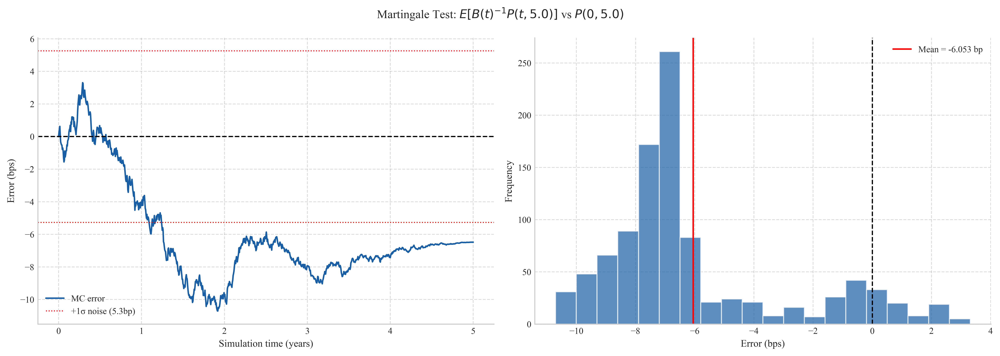


--- Starting CMS Spread Pricing ---
Pricing Method       : Trapezoidal
CMS Spread PV        : 108.36 bps
Standard Error       : 0.4622 bps


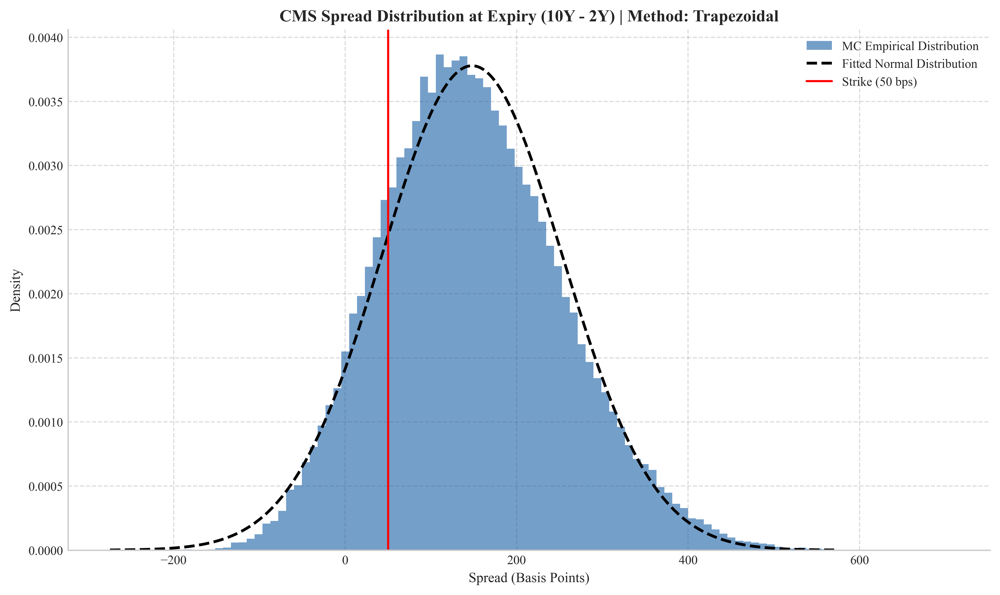

In [ ]:
kappa_calib = params_equal[0:3]
sigma_calib = params_equal[3:6]

bootstrapped_T = ois_curve['T'].values
bootstrapped_DF = ois_curve['Discount_Factor'].values
T_nodes = np.concatenate([[0.0], bootstrapped_T])
DF_nodes = np.concatenate([[1.0], bootstrapped_DF])
global_pchip = PchipInterpolator(T_nodes, np.log(DF_nodes))

def market_P_0(t): return np.exp(global_pchip(t))
def market_f_0(t): return -global_pchip.derivative()(t)

DISCOUNT_METHOD = 'trapezoidal'  # Options: 'exact' or 'trapezoidal'

time_grid, error_bps = run_martingale_test(
    kappa=kappa_calib, 
    sigma=sigma_calib, 
    T_test = 5.0, 
    P_0_func=market_P_0, 
    f_0_func=market_f_0, 
    num_paths=100000, 
    num_steps=1000, 
    discount_method=DISCOUNT_METHOD
)

print("\n--- Starting CMS Spread Pricing ---")
T_expiry = 10.0 # Years
strike_rate = 0.0050 # Bps / 10000

T_10Y_cashflows = np.arange(T_expiry + 1.0, T_expiry + 11.0, 1.0)
tau_10Y = np.ones(10) * (365.0 / 360.0) 
T_2Y_cashflows = np.arange(T_expiry + 1.0, T_expiry + 3.0, 1.0)
tau_2Y = np.ones(2) * (365.0 / 360.0)

mc_price, mc_std_err, simulated_spreads = run_hjm_monte_carlo(
    kappa=kappa_calib, sigma=sigma_calib, 
    T_expiry=T_expiry, 
    T_10Y_cashflows=T_10Y_cashflows, tau_10Y=tau_10Y, 
    T_2Y_cashflows=T_2Y_cashflows, tau_2Y=tau_2Y, 
    P_0_func=market_P_0, f_0_func=market_f_0, 
    strike=strike_rate, 
    num_paths=100000, num_steps=500,
    discount_method=DISCOUNT_METHOD
)

print(f"Pricing Method       : {DISCOUNT_METHOD.title()}")
print(f"CMS Spread PV        : {mc_price * 10000:.2f} bps")
print(f"Standard Error       : {mc_std_err * 10000:.4f} bps")

# --- Plotting Distribution ---
plt.figure(figsize=(10, 6), dpi=500)
plt.hist(simulated_spreads * 10000, bins=100, density=True, alpha=0.6, color='#185FA5', label='MC Empirical Distribution')

mu_empirical = np.mean(simulated_spreads * 10000)
std_empirical = np.std(simulated_spreads * 10000)
x_axis = np.linspace(mu_empirical - 4*std_empirical, mu_empirical + 4*std_empirical, 1000)

plt.plot(x_axis, norm.pdf(x_axis, mu_empirical, std_empirical), color='black', lw=2, linestyle='--', label='Fitted Normal Distribution')
plt.axvline(strike_rate * 10000, color='red', lw=1.5, label=f'Strike ({strike_rate * 10000:.0f} bps)')

plt.title(f"CMS Spread Distribution at Expiry (10Y - 2Y) | Method: {DISCOUNT_METHOD.title()}", fontweight='bold')
plt.xlabel("Spread (Basis Points)")
plt.ylabel("Density")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


--- Initializing Pricing Engine for 10.0Y Expiry ---
--- Running Path-Dependent Monte Carlo Simulation ---

--- Pricing Results ---
Analytical PV  : 80.65 bps
Monte Carlo PV : 108.36 bps
Convexity Gap  : +27.71 bps

--- Generating Accumulated Variance Plot ---


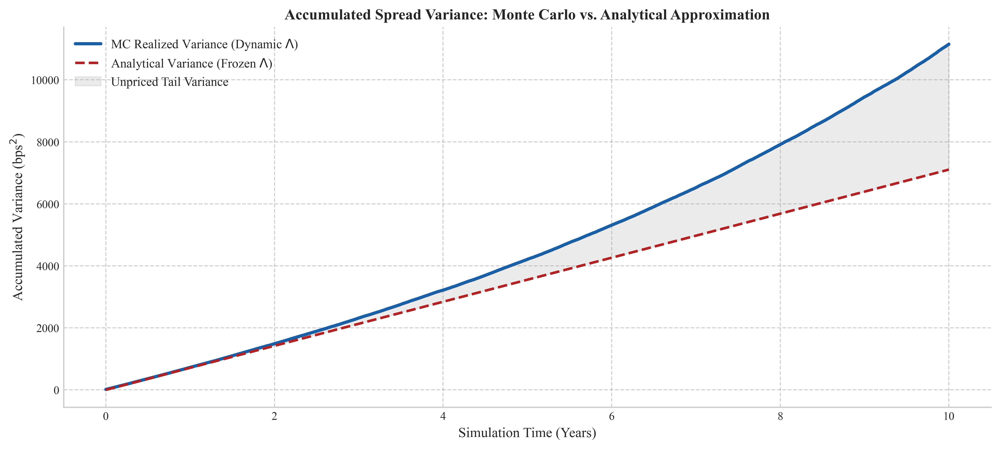

In [21]:
import numpy as np
import matplotlib.pyplot as plt

def plot_accumulated_variance_divergence(spread_paths, analytical_sigma, T_expiry):
    """
    Calculates and visualizes the accumulated variance (integrated Lambda squared)
    of the 10Y-2Y forward spread over the simulation horizon.
    
    Parameters:
    - spread_paths: 2D numpy array of shape (num_paths, num_steps) from the MC engine
    - analytical_sigma: The frozen-drift analytical spread volatility (in decimal form)
    - T_expiry: The option expiration time in years
    """
    num_steps = spread_paths.shape[1]
    time_grid = np.linspace(0, T_expiry, num_steps)
    
    # 1. Calculate Monte Carlo Accumulated Variance
    # We multiply by 10000 to convert spreads to basis points, then calculate cross-sectional variance
    mc_variance_trajectory = np.var(spread_paths * 10000, axis=0)
    
    # 2. Calculate Analytical Accumulated Variance
    # Under the Bachelier frozen-drift assumption, the integrated variance grows linearly over time.
    # Terminal variance = (sigma * 10000)^2 * T_expiry
    terminal_analytical_var = (analytical_sigma * 10000) ** 2
    analytical_variance_trajectory = np.linspace(0, terminal_analytical_var, num_steps)
    
    # 3. Generate the Plot
    fig, ax = plt.subplots(figsize=(11, 5), dpi=500)
    
    ax.plot(time_grid, mc_variance_trajectory, 
            label='MC Realized Variance (Dynamic $\\Lambda$)', 
            color='#185FA5', linewidth=2.5)
    
    ax.plot(time_grid, analytical_variance_trajectory, 
            label='Analytical Variance (Frozen $\\Lambda$)', 
            color='firebrick', linestyle='--', linewidth=2)
    
    # Formatting
    ax.set_title('Accumulated Spread Variance: Monte Carlo vs. Analytical Approximation', 
                 fontweight='bold', fontsize=12)
    ax.set_xlabel('Simulation Time (Years)', fontsize=11)
    ax.set_ylabel('Accumulated Variance (bps$^2$)', fontsize=11)
    
    # Shade the "Dynamic Convexity Gap"
    ax.fill_between(time_grid, analytical_variance_trajectory, mc_variance_trajectory, 
                    color='gray', alpha=0.15, label='Unpriced Tail Variance')
    
    ax.legend(loc='upper left', fontsize=10)
    ax.grid(True, linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.savefig('accumulated_variance.pdf', dpi=500)
    
    return fig, ax

# =====================================================================
# 1. SETUP & DATA PREPARATION
# =====================================================================
kappa_calib = params_equal[0:3]
sigma_calib = params_equal[3:6]

bootstrapped_T = ois_curve['T'].values
bootstrapped_DF = ois_curve['Discount_Factor'].values
T_nodes = np.concatenate([[0.0], bootstrapped_T])
DF_nodes = np.concatenate([[1.0], bootstrapped_DF])
global_pchip = PchipInterpolator(T_nodes, np.log(DF_nodes))

def market_P_0(t): return np.exp(global_pchip(t))
def market_f_0(t): return -global_pchip.derivative()(t)

DISCOUNT_METHOD = 'trapezoidal'
T_expiry = 10.0  # e.g., 5-Year Expiry to clearly show divergence
expiry_label = f'{int(T_expiry)}YR' 
strike_rate = 0.0050 # 50 bps

T_10Y_cashflows = np.arange(T_expiry + 1.0, T_expiry + 11.0, 1.0)
tau_10Y = np.ones(10) * (365.0 / 360.0) 
T_2Y_cashflows = np.arange(T_expiry + 1.0, T_expiry + 3.0, 1.0)
tau_2Y = np.ones(2) * (365.0 / 360.0)

print(f"\n--- Initializing Pricing Engine for {T_expiry}Y Expiry ---")

# =====================================================================
# 2. RUN ANALYTICAL (BACHELIER) PRICER
# =====================================================================
cell_10Y = detailed_results[(expiry_label, '10YR')]
cell_2Y  = detailed_results[(expiry_label, '2YR')]

analytical_results = price_analytical_cms_spread(
    cell_data_10Y=cell_10Y, 
    cell_data_2Y=cell_2Y, 
    kappa=kappa_calib, 
    sigma=sigma_calib, 
    strike=strike_rate, 
    option_type='call'
)

# =====================================================================
# 3. RUN MONTE CARLO (HJM) PRICER
# =====================================================================
print("--- Running Path-Dependent Monte Carlo Simulation ---")
mc_price, mc_std_err, spread_paths = run_hjm_monte_carlo_paths(
    kappa=kappa_calib, sigma=sigma_calib, 
    T_expiry=T_expiry, 
    T_10Y_cashflows=T_10Y_cashflows, tau_10Y=tau_10Y, 
    T_2Y_cashflows=T_2Y_cashflows, tau_2Y=tau_2Y, 
    P_0_func=market_P_0, f_0_func=market_f_0, 
    strike=strike_rate, 
    num_paths=100000, num_steps=500,
    discount_method=DISCOUNT_METHOD
)

print("\n--- Pricing Results ---")
print(f"Analytical PV  : {analytical_results['PV'] * 10000:.2f} bps")
print(f"Monte Carlo PV : {mc_price * 10000:.2f} bps")
print(f"Convexity Gap  : {(mc_price - analytical_results['PV']) * 10000:+.2f} bps")

# =====================================================================
# 4. GENERATE VARIANCE DIVERGENCE DIAGNOSTIC
# =====================================================================
print("\n--- Generating Accumulated Variance Plot ---")

# Pass the simulated paths and the analytical spread volatility to the plotting function
fig, ax = plot_accumulated_variance_divergence(
    spread_paths=spread_paths, 
    analytical_sigma=analytical_results['sigma_spread'], 
    T_expiry=T_expiry
)

# Display the plot
plt.show()

In [22]:
# ANALYTICAL EXECUTION BLOCK
# =====================================================================
# 1. Define Option Parameters
expiry_label = '2YR'  # e.g., 2-Year option expiry
strike_rate = 0.0050  # 50 bps strike

# 2. Extract calibrated parameters (from previous calibration phase)
# Assumes params_equal is [kappa_1, kappa_2, kappa_3, sigma_1, sigma_2, sigma_3]
kappa_calib = params_equal[0:3]
sigma_calib = params_equal[3:6]

# 3. Pull the exact pre-computed market data cells from detailed_results
cell_10Y = detailed_results[(expiry_label, '10YR')]
cell_2Y  = detailed_results[(expiry_label, '2YR')]

# 4. Run the Analytical Pricer
analytical_results = price_analytical_cms_spread(
    cell_data_10Y=cell_10Y, 
    cell_data_2Y=cell_2Y, 
    kappa=kappa_calib, 
    sigma=sigma_calib, 
    strike=strike_rate, 
    option_type='call'
)

# 5. Formatted Diagnostic Output
print("="*60)
print(f" THEORETICAL CMS SPREAD PRICING (BACHELIER EXACT)")
print("="*60)
print(f"Option Expiry         : {expiry_label} ({cell_10Y['T_alpha']:.4f} Years)")
print(f"Strike Rate (K)       : {strike_rate * 10000:.1f} bps")
print("-" * 60)
print(f"Initial 10Y Forward   : {analytical_results['S_10_initial'] * 10000:.2f} bps")
print(f"10Y Convexity Adj     : {analytical_results['CA_10'] * 10000:+.2f} bps")
print(f"Initial 2Y Forward    : {analytical_results['S_2_initial'] * 10000:.2f} bps")
print(f"2Y Convexity Adj      : {analytical_results['CA_2'] * 10000:+.2f} bps")
print("-" * 60)
print(f"Expected Spread (μ)   : {analytical_results['mu_spread'] * 10000:.2f} bps")
print(f"Spread Volatility (σ) : {analytical_results['sigma_spread'] * 10000:.2f} bps")
print(f"Discount Factor P(0,T): {analytical_results['D_alpha']:.6f}")
print("="*60)
print(f"ANALYTICAL PV         : {analytical_results['PV'] * 10000:.4f} bps")
print("="*60)

 THEORETICAL CMS SPREAD PRICING (BACHELIER EXACT)
Option Expiry         : 2YR (2.0278 Years)
Strike Rate (K)       : 50.0 bps
------------------------------------------------------------
Initial 10Y Forward   : 288.06 bps
10Y Convexity Adj     : +66.80 bps
Initial 2Y Forward    : 237.97 bps
2Y Convexity Adj      : +23.81 bps
------------------------------------------------------------
Expected Spread (μ)   : 93.08 bps
Spread Volatility (σ) : 57.18 bps
Discount Factor P(0,T): 0.960629
ANALYTICAL PV         : 48.5440 bps


Expiry   | Analytical PV   | MC PV      | Gap (MC - Ana) 
1YR      |     35.40 bps   |   36.17 bp |      0.78 bps
2YR      |     48.54 bps   |   50.97 bp |      2.42 bps
3YR      |     60.00 bps   |   64.90 bp |      4.90 bps
4YR      |     69.52 bps   |   77.58 bp |      8.06 bps
5YR      |     76.57 bps   |   88.37 bp |     11.80 bps
6YR      |     79.70 bps   |   95.13 bp |     15.43 bps
7YR      |     81.65 bps   |  101.09 bp |     19.44 bps
8YR      |     83.42 bps   |  106.64 bp |     23.22 bps
9YR      |     82.65 bps   |  109.71 bp |     27.06 bps
10YR     |     80.65 bps   |  111.36 bp |     30.71 bps


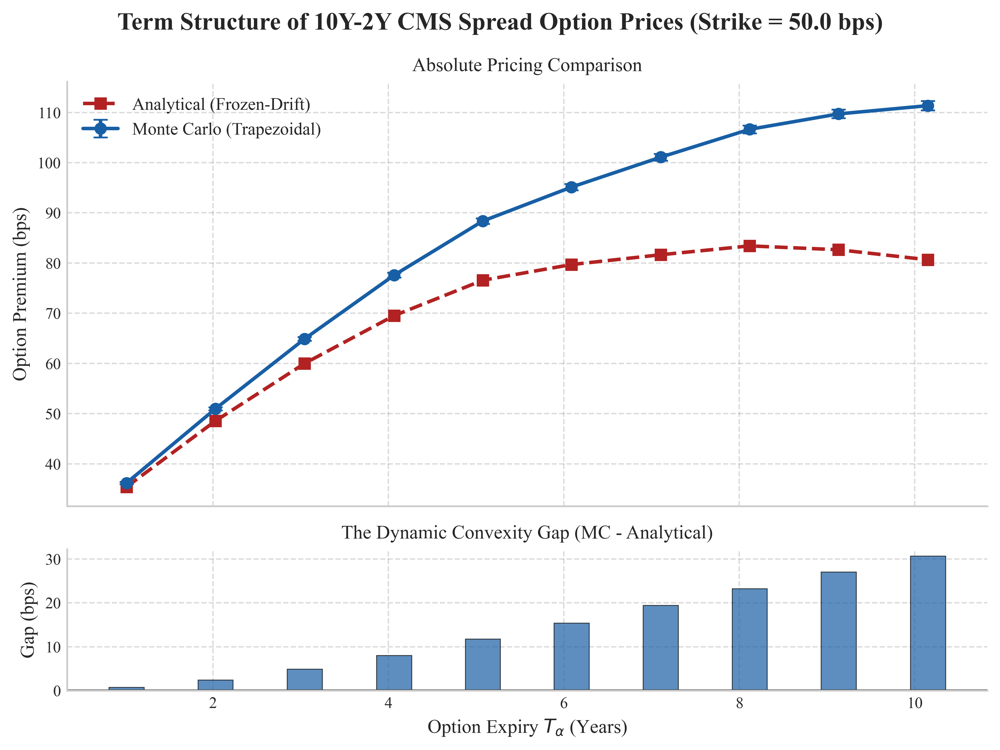


COPY AND PASTE THE LATEX CODE BELOW INTO YOUR THESIS:

\begin{table}[h!]
\centering
\renewcommand{\arraystretch}{1.2}
\begin{tabular}{l r r r r}
\toprule
\textbf{Expiry} & \textbf{Analytical} & \textbf{Monte Carlo} & \textbf{Std. Error} & \textbf{Convexity Gap} \\
\textbf{($T_\alpha$)} & \textbf{PV (bps)} & \textbf{PV (bps)} & \textbf{(bps)} & \textbf{(MC - Ana)} \\
\midrule
1 Year & 35.40 & 36.17 & 0.11 & 0.78 \\
2 Year & 48.54 & 50.97 & 0.16 & 2.42 \\
3 Year & 60.00 & 64.90 & 0.20 & 4.90 \\
4 Year & 69.52 & 77.58 & 0.24 & 8.06 \\
5 Year & 76.57 & 88.37 & 0.28 & 11.80 \\
6 Year & 79.70 & 95.13 & 0.32 & 15.43 \\
7 Year & 81.65 & 101.09 & 0.36 & 19.44 \\
8 Year & 83.42 & 106.64 & 0.40 & 23.22 \\
9 Year & 82.65 & 109.71 & 0.44 & 27.06 \\
10 Year & 80.65 & 111.36 & 0.48 & 30.71 \\
\bottomrule
\end{tabular}
\caption{Term structure of 10Y-2Y CMS spread option premiums utilizing a fixed 50 bps strike. The dynamic convexity gap (Monte Carlo minus Analytical) illustrates the magnitude of path

In [63]:
import numpy as np
import matplotlib.pyplot as plt

# =====================================================================
# 1. SETUP PRICING LOOP
# =====================================================================
# Define the expiries you want to test (must match your detailed_results keys)
expiries_to_test = ['1YR', '2YR', '3YR', '4YR', '5YR', '6YR','7YR','8YR','9YR', '10YR']
# expiries_to_test = ['5YR', '6YR','7YR','8YR','9YR', '10YR', '20YR', '30YR']
strike_rate = 0.0050 # 50 bps strike

# Storage arrays for plotting and LaTeX
t_alphas = []
mc_prices = []
mc_std_errors = []
analytical_prices = []
convexity_gaps = []

print("="*65)
print(f"{'Expiry':<8} | {'Analytical PV':<15} | {'MC PV':<10} | {'Gap (MC - Ana)':<15}")
print("="*65)

# =====================================================================
# 2. RUN DUAL PRICING ENGINES ACROSS THE TERM STRUCTURE
# =====================================================================
for exp_lbl in expiries_to_test:
    # 1. Extract exact market schedules from calibration dict
    cell_10Y = detailed_results[(exp_lbl, '10YR')]
    cell_2Y  = detailed_results[(exp_lbl, '2YR')]
    
    T_expiry = cell_10Y['T_alpha']
    t_alphas.append(T_expiry)
    
    # 2. Run Analytical Bachelier Engine
    ana_res = price_analytical_cms_spread(
        cell_data_10Y=cell_10Y, 
        cell_data_2Y=cell_2Y, 
        kappa=kappa_calib, 
        sigma=sigma_calib, 
        strike=strike_rate, 
        option_type='call'
    )
    ana_pv_bps = ana_res['PV'] * 10000
    analytical_prices.append(ana_pv_bps)
    
    # 3. Run Monte Carlo Engine (Trapezoidal Integration)
    # Scale num_steps by expiry to maintain constant resolution (e.g., 100 steps per year)
    steps_per_year = 100
    total_steps = int(np.ceil(T_expiry * steps_per_year))
    
    mc_price, mc_std_err, sim_spreads = run_hjm_monte_carlo(
        kappa=kappa_calib, 
        sigma=sigma_calib, 
        T_expiry=T_expiry, 
        T_10Y_cashflows=cell_10Y['T_coupons'], 
        tau_10Y=cell_10Y['tau_coupons'], 
        T_2Y_cashflows=cell_2Y['T_coupons'], 
        tau_2Y=cell_2Y['tau_coupons'], 
        P_0_func=market_P_0, 
        f_0_func=market_f_0, 
        strike=strike_rate, 
        num_paths=100000, 
        num_steps=total_steps, 
        discount_method='trapezoidal'
    )
    mc_pv_bps = mc_price * 10000
    mc_prices.append(mc_pv_bps)
    mc_std_errors.append(mc_std_err * 10000)
    
    # 4. Calculate the Convexity Gap
    gap_bps = mc_pv_bps - ana_pv_bps
    convexity_gaps.append(gap_bps)
    
    # Print real-time progress
    print(f"{exp_lbl:<8} | {ana_pv_bps:>9.2f} bps   | {mc_pv_bps:>7.2f} bp | {gap_bps:>9.2f} bps")

print("="*65)

# =====================================================================
# 3. GENERATE PUBLICATION-READY PLOT
# =====================================================================
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 6), gridspec_kw={'height_ratios': [3, 1]}, sharex=True, dpi=500)

fig.suptitle(f"Term Structure of 10Y-2Y CMS Spread Option Prices (Strike = {strike_rate*10000} bps)", fontsize=14, fontweight='bold')

# --- Top Panel: Absolute Prices ---
# Plot Analytical
ax1.plot(t_alphas, analytical_prices, marker='s', markersize=6, linestyle='--', color='#B22222', 
         linewidth=2, label='Analytical (Frozen-Drift)')

# Plot Monte Carlo with error bars
ax1.errorbar(t_alphas, mc_prices, yerr=np.array(mc_std_errors)*1.96, marker='o', markersize=6, 
             linestyle='-', color='#185FA5', linewidth=2, capsize=4, label='Monte Carlo (Trapezoidal)')

ax1.set_ylabel("Option Premium (bps)", fontsize=11)
ax1.set_title("Absolute Pricing Comparison", fontsize=11)
ax1.legend(loc='upper left', fontsize=10)
ax1.grid(True, alpha=0.3)

# --- Bottom Panel: The Convexity Gap ---
# Color bars dynamically based on whether gap is positive or negative
bar_colors = ['#185FA5' if gap > 0 else '#B22222' for gap in convexity_gaps]

ax2.bar(t_alphas, convexity_gaps, width=0.4, color=bar_colors, alpha=0.7, edgecolor='black', linewidth=0.5)
ax2.axhline(0, color='black', linestyle='-', linewidth=1.2)

ax2.set_xlabel("Option Expiry $T_{\\alpha}$ (Years)", fontsize=11)
ax2.set_ylabel("Gap (bps)", fontsize=11)
ax2.set_title("The Dynamic Convexity Gap (MC - Analytical)", fontsize=11)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('cms_pricing_term_structure.pdf', dpi=500, bbox_inches='tight')
plt.show()

# =====================================================================
# 4. GENERATE LATEX TABLE
# =====================================================================
print("\n" + "="*70)
print("COPY AND PASTE THE LATEX CODE BELOW INTO YOUR THESIS:")
print("="*70 + "\n")

latex_str = r"""\begin{table}[h!]
\centering
\renewcommand{\arraystretch}{1.2}
\begin{tabular}{l r r r r}
\toprule
\textbf{Expiry} & \textbf{Analytical} & \textbf{Monte Carlo} & \textbf{Std. Error} & \textbf{Convexity Gap} \\
\textbf{($T_\alpha$)} & \textbf{PV (bps)} & \textbf{PV (bps)} & \textbf{(bps)} & \textbf{(MC - Ana)} \\
\midrule
"""

for t, ana, mc, se, gap in zip(t_alphas, analytical_prices, mc_prices, mc_std_errors, convexity_gaps):
    latex_str += f"{int(t)} Year & {ana:.2f} & {mc:.2f} & {se:.2f} & {gap:.2f} \\\\\n"

latex_str += r"""\bottomrule
\end{tabular}
\caption{Term structure of 10Y-2Y CMS spread option premiums utilizing a fixed 50 bps strike. The dynamic convexity gap (Monte Carlo minus Analytical) illustrates the magnitude of path-dependent curvature uncaptured by the closed-form Bachelier approximation.}
\label{tab:term_structure_fixed}
\end{table}"""

print(latex_str)

<Axes: >

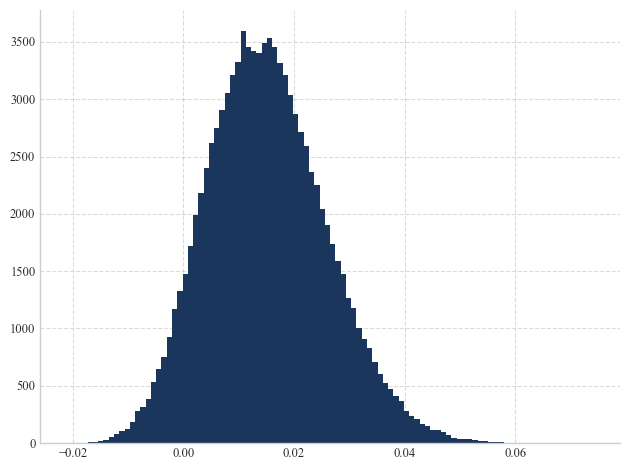

In [50]:
pd.Series(sim_spreads).hist(bins=100)

Running Option Pricing Profile for 2YR Expiry
Strike: -25.0 bps | Ana: 113.82 bps | MC: 116.39 bps
Strike: -20.0 bps | Ana: 109.12 bps | MC: 111.69 bps
Strike: -15.0 bps | Ana: 104.44 bps | MC: 107.02 bps
Strike: -10.0 bps | Ana:  99.80 bps | MC: 102.37 bps
Strike:  -5.0 bps | Ana:  95.18 bps | MC:  97.75 bps
Strike:   0.0 bps | Ana:  90.61 bps | MC:  93.18 bps
Strike:   5.0 bps | Ana:  86.08 bps | MC:  88.65 bps
Strike:  10.0 bps | Ana:  81.60 bps | MC:  84.17 bps
Strike:  15.0 bps | Ana:  77.17 bps | MC:  79.75 bps
Strike:  20.0 bps | Ana:  72.82 bps | MC:  75.40 bps
Strike:  25.0 bps | Ana:  68.54 bps | MC:  71.12 bps
Strike:  30.0 bps | Ana:  64.34 bps | MC:  66.93 bps
Strike:  35.0 bps | Ana:  60.23 bps | MC:  62.84 bps
Strike:  40.0 bps | Ana:  56.22 bps | MC:  58.84 bps
Strike:  45.0 bps | Ana:  52.33 bps | MC:  54.96 bps
Strike:  50.0 bps | Ana:  48.54 bps | MC:  51.20 bps
Strike:  55.0 bps | Ana:  44.89 bps | MC:  47.55 bps
Strike:  60.0 bps | Ana:  41.37 bps | MC:  44.04 bps


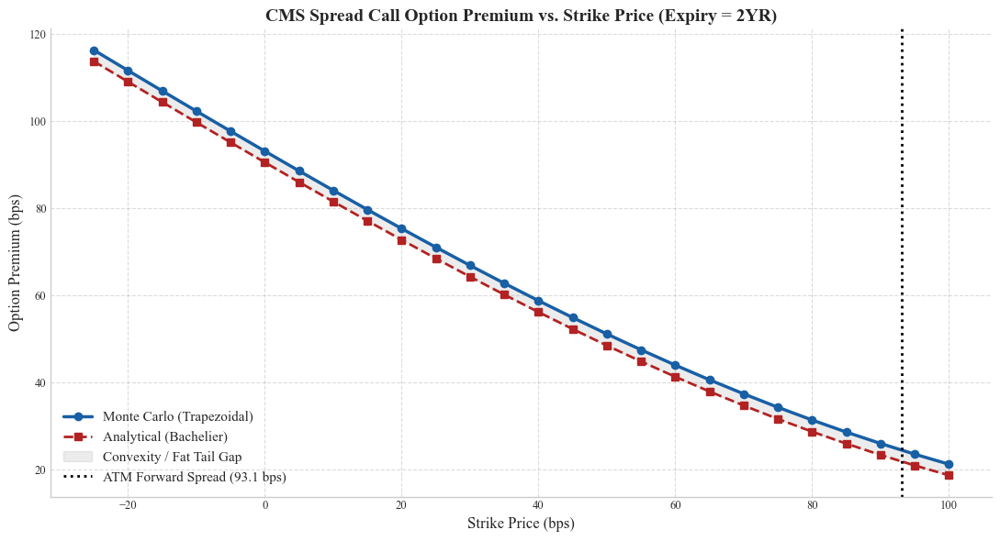

In [51]:
import numpy as np
import matplotlib.pyplot as plt

# =====================================================================
# 1. SETUP STRIKE RANGE AND PARAMETERS
# =====================================================================
# Generate an array of strikes from -25 bps to 100 bps
strikes_bps = np.linspace(-25, 100, 26)
strikes_decimal = strikes_bps / 10000.0

# Choose a representative expiry for the profile (5YR is a great midpoint)
exp_lbl = '2YR'
cell_10Y = detailed_results[(exp_lbl, '10YR')]
cell_2Y  = detailed_results[(exp_lbl, '2YR')]
T_expiry = cell_10Y['T_alpha']

mc_prices_strike = []
ana_prices_strike = []

print("="*50)
print(f"Running Option Pricing Profile for {exp_lbl} Expiry")
print("="*50)

# =====================================================================
# 2. RUN PRICING ENGINE ACROSS STRIKES
# =====================================================================
for K in strikes_decimal:
    # 1. Analytical Bachelier Price
    ana_res = price_analytical_cms_spread(
        cell_data_10Y=cell_10Y, cell_data_2Y=cell_2Y, 
        kappa=kappa_calib, sigma=sigma_calib, strike=K, option_type='call'
    )
    ana_prices_strike.append(ana_res['PV'] * 10000)
    
    # 2. Monte Carlo Price (Trapezoidal Integration)
    steps_per_year = 100
    total_steps = int(np.ceil(T_expiry * steps_per_year))
    
    # We can use slightly fewer paths (e.g., 50k) here to speed up the loop
    mc_price, _, _ = run_hjm_monte_carlo(
        kappa=kappa_calib, sigma=sigma_calib, T_expiry=T_expiry, 
        T_10Y_cashflows=cell_10Y['T_coupons'], tau_10Y=cell_10Y['tau_coupons'], 
        T_2Y_cashflows=cell_2Y['T_coupons'], tau_2Y=cell_2Y['tau_coupons'], 
        P_0_func=market_P_0, f_0_func=market_f_0, strike=K, 
        num_paths=50000, num_steps=total_steps, discount_method='trapezoidal'
    )
    mc_prices_strike.append(mc_price * 10000)
    
    print(f"Strike: {K*10000:>5.1f} bps | Ana: {ana_res['PV']*10000:>6.2f} bps | MC: {mc_price*10000:>6.2f} bps")

# Extract the At-The-Money (ATM) Forward Spread to mark on the chart
atm_forward_bps = ana_res['mu_spread'] * 10000

# =====================================================================
# 3. PLOT THE OPTION PROFILE
# =====================================================================
fig, ax = plt.subplots(figsize=(11, 6))

# Plot Monte Carlo
ax.plot(strikes_bps, mc_prices_strike, marker='o', markersize=6, color='#185FA5', 
        lw=2.5, label='Monte Carlo (Trapezoidal)')

# Plot Analytical
ax.plot(strikes_bps, ana_prices_strike, marker='s', markersize=6, color='#B22222', 
        lw=2, linestyle='--', label='Analytical (Bachelier)')

# Fill the convexity gap to make it visually pop
ax.fill_between(strikes_bps, ana_prices_strike, mc_prices_strike, color='gray', alpha=0.15, label='Convexity / Fat Tail Gap')

# Add vertical line for the ATM Forward Spread
ax.axvline(atm_forward_bps, color='black', linestyle=':', lw=2, 
           label=f'ATM Forward Spread ({atm_forward_bps:.1f} bps)')

# Formatting
ax.set_title(f"CMS Spread Call Option Premium vs. Strike Price (Expiry = {exp_lbl})", fontsize=14, fontweight='bold')
ax.set_xlabel("Strike Price (bps)", fontsize=12)
ax.set_ylabel("Option Premium (bps)", fontsize=12)
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'cms_spread_profile_{exp_lbl}.png', dpi=300, bbox_inches='tight')
plt.show()

In [52]:
import numpy as np

# =====================================================================
# 1. SILENT TERMINAL MARTINGALE EXTRACTOR
# =====================================================================
def get_terminal_discount_expectation(kappa, sigma, T_test, P_0_func, f_0_func, num_paths=100000, steps_per_year=100, seed=42):
    """
    Silently runs the exact Trapezoidal integration from your HJM engine 
    to extract the expected terminal discount factor E[D(0,T)].
    """
    rng = np.random.default_rng(seed)
    kappa = np.asarray(kappa, dtype=float).reshape(3, 1)
    sigma = np.asarray(sigma, dtype=float).reshape(3, 1)
    
    num_steps = int(np.ceil(T_test * steps_per_year))
    dt = T_test / num_steps
    
    def calc_Psi(t): return (sigma**2 / (2.0*kappa**2)) * (1.0 - np.exp(-kappa*t))**2
    def calc_Y(t): return (sigma**2 / (2.0*kappa)) * (1.0 - np.exp(-2.0*kappa*t))
    
    exp_k_dt = np.exp(-kappa * dt)
    std_X_dt = np.sqrt(calc_Y(dt))
    
    X = np.zeros((3, num_paths))
    integral_r = np.zeros(num_paths)
    r_curr = f_0_func(0.0)
    
    for k in range(num_steps):
        t_next = (k + 1) * dt
        Z = rng.standard_normal((3, num_paths))
        X = exp_k_dt * X + std_X_dt * Z
        
        Psi_next = calc_Psi(t_next)
        r_next = f_0_func(t_next) + np.sum(X + Psi_next, axis=0)
        integral_r += 0.5 * (r_curr + r_next) * dt
        r_curr = r_next
        
    stochastic_discount = np.exp(-integral_r)
    
    mc_expected = float(np.mean(stochastic_discount))
    mc_se = float(np.std(stochastic_discount, ddof=1) / np.sqrt(num_paths))
    
    return mc_expected, mc_se

# =====================================================================
# 2. RUN SIMULATIONS & GENERATE TABLE
# =====================================================================
test_maturities = [1.0, 2.0, 3.0, 5.0, 7.0, 10.0]
num_paths = 100000

print("Running Terminal Martingale Tests for LaTeX Table...\n")
latex_data = []

for T in test_maturities:
    market_P0 = market_P_0(T)
    
    # Run the silent extractor
    mc_P0, mc_se = get_terminal_discount_expectation(
        kappa=kappa_calib, 
        sigma=sigma_calib, 
        T_test=T, 
        P_0_func=market_P_0, 
        f_0_func=market_f_0, 
        num_paths=num_paths
    )
    
    # Calculate errors in basis points
    error_bps = (mc_P0 - market_P0) * 10000
    se_bps = mc_se * 10000
    
    latex_data.append((T, market_P0, mc_P0, error_bps, se_bps))
    print(f"Maturity: {T:>4.1f}Y | Market: {market_P0:.6f} | MC: {mc_P0:.6f} | Error: {error_bps:>6.2f} bps | SE: {se_bps:>5.2f} bps")

# =====================================================================
# 3. PRINT LATEX CODE
# =====================================================================
print("\n" + "="*70)
print("COPY AND PASTE THE LATEX CODE BELOW INTO YOUR THESIS:")
print("="*70 + "\n")

latex_str = r"""\begin{table}[h!]
\centering
\renewcommand{\arraystretch}{1.2}
\begin{tabular}{l c c r r}
\toprule
\textbf{Maturity ($T$)} & \textbf{Market $P(0,T)$} & \textbf{MC Expectation $\mathbb{E}[D(0,T)]$} & \textbf{Error (bps)} & \textbf{Std. Error (bps)} \\
\midrule
"""

for row in latex_data:
    T, mkt, mc, err, se = row
    latex_str += f"{int(T)} Year & {mkt:.6f} & {mc:.6f} & {err:.2f} & {se:.2f} \\\\\n"

latex_str += r"""\bottomrule
\end{tabular}
\caption{Martingale Validation: Comparison of analytical market zero-coupon bond prices against Monte Carlo expected stochastic discount factors ($N = 100,000$ paths, Trapezoidal Integration). Discrepancies fall strictly within the theoretical $1\sigma$ standard error bounds, confirming the absence of systematic arbitrage drift within the numerical implementation.}
\label{tab:martingale_validation}
\end{table}"""

print(latex_str)

Running Terminal Martingale Tests for LaTeX Table...

Maturity:  1.0Y | Market: 0.981014 | MC: 0.981035 | Error:   0.21 bps | SE:  0.55 bps
Maturity:  2.0Y | Market: 0.961207 | MC: 0.961155 | Error:  -0.53 bps | SE:  1.49 bps
Maturity:  3.0Y | Market: 0.939767 | MC: 0.939483 | Error:  -2.84 bps | SE:  2.63 bps
Maturity:  5.0Y | Market: 0.893841 | MC: 0.892985 | Error:  -8.56 bps | SE:  5.27 bps
Maturity:  7.0Y | Market: 0.845776 | MC: 0.844470 | Error: -13.06 bps | SE:  8.14 bps
Maturity: 10.0Y | Market: 0.771446 | MC: 0.769873 | Error: -15.73 bps | SE: 12.67 bps

COPY AND PASTE THE LATEX CODE BELOW INTO YOUR THESIS:

\begin{table}[h!]
\centering
\renewcommand{\arraystretch}{1.2}
\begin{tabular}{l c c r r}
\toprule
\textbf{Maturity ($T$)} & \textbf{Market $P(0,T)$} & \textbf{MC Expectation $\mathbb{E}[D(0,T)]$} & \textbf{Error (bps)} & \textbf{Std. Error (bps)} \\
\midrule
1 Year & 0.981014 & 0.981035 & 0.21 & 0.55 \\
2 Year & 0.961207 & 0.961155 & -0.53 & 1.49 \\
3 Year & 0.939767 & 0

Generating Strike Profile Data for Expiry: 1YR...

Calculated ATM Forward Spread: 80.08 bps

Strike -20 bps | Ana:  98.29 | MC:  98.96 | Gap:  0.68
Strike -10 bps | Ana:  88.60 | MC:  89.28 | Gap:  0.67
Strike   0 bps | Ana:  79.02 | MC:  79.69 | Gap:  0.66
Strike  10 bps | Ana:  69.60 | MC:  70.26 | Gap:  0.66
Strike  20 bps | Ana:  60.42 | MC:  61.09 | Gap:  0.67
Strike  30 bps | Ana:  51.57 | MC:  52.26 | Gap:  0.69
Strike  40 bps | Ana:  43.19 | MC:  43.92 | Gap:  0.73
Strike  50 bps | Ana:  35.40 | MC:  36.17 | Gap:  0.78
Strike  60 bps | Ana:  28.32 | MC:  29.14 | Gap:  0.82
Strike  70 bps | Ana:  22.06 | MC:  22.91 | Gap:  0.85
Strike  80 bps | Ana:  16.69 | MC:  17.55 | Gap:  0.86
Strike  90 bps | Ana:  12.24 | MC:  13.09 | Gap:  0.85
Strike 100 bps | Ana:   8.68 | MC:   9.49 | Gap:  0.81
Strike 110 bps | Ana:   5.93 | MC:   6.67 | Gap:  0.73
Strike 120 bps | Ana:   3.91 | MC:   4.54 | Gap:  0.63


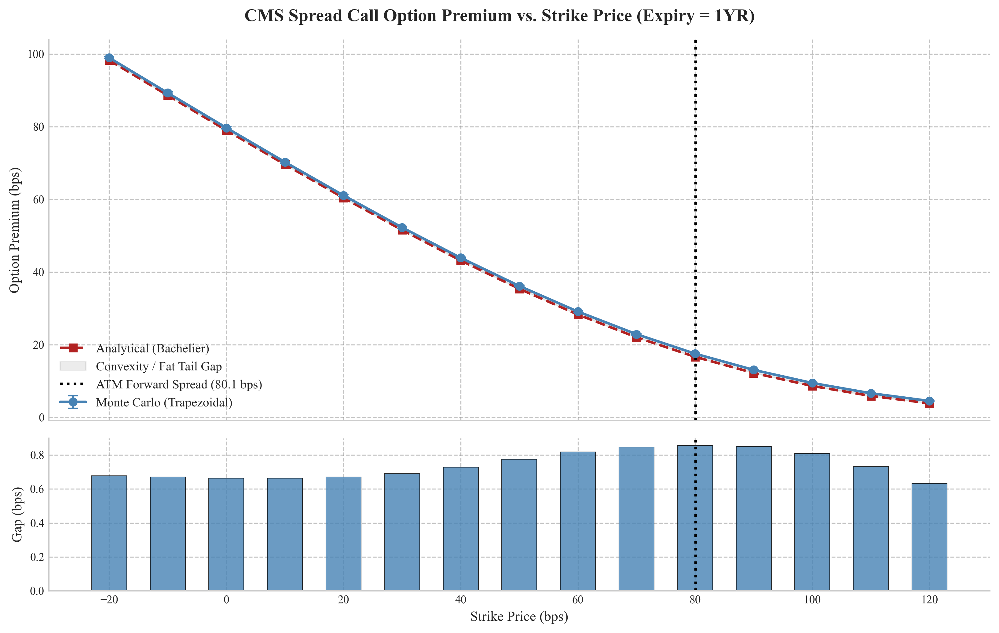


COPY AND PASTE THE LATEX CODE BELOW INTO YOUR THESIS:

\begin{table}[h!]
\centering
\renewcommand{\arraystretch}{1.2}
\begin{tabular}{r r r r r}
\toprule
\textbf{Strike} & \textbf{Analytical} & \textbf{Monte Carlo} & \textbf{Std. Error} & \textbf{Convexity Gap} \\
\textbf{(bps)} & \textbf{PV (bps)} & \textbf{PV (bps)} & \textbf{(bps)} & \textbf{(MC - Ana)} \\
\midrule
-20 & 98.29 & 98.96 & 0.14 & 0.68 \\
-10 & 88.60 & 89.28 & 0.14 & 0.67 \\
0 & 79.02 & 79.69 & 0.14 & 0.66 \\
10 & 69.60 & 70.26 & 0.13 & 0.66 \\
20 & 60.42 & 61.09 & 0.13 & 0.67 \\
30 & 51.57 & 52.26 & 0.13 & 0.69 \\
40 & 43.19 & 43.92 & 0.12 & 0.73 \\
50 & 35.40 & 36.17 & 0.11 & 0.78 \\
60 & 28.32 & 29.14 & 0.10 & 0.82 \\
70 & 22.06 & 22.91 & 0.09 & 0.85 \\
80 & 16.69 & 17.55 & 0.08 & 0.86 \\
90 & 12.24 & 13.09 & 0.07 & 0.85 \\
100 & 8.68 & 9.49 & 0.06 & 0.81 \\
110 & 5.93 & 6.67 & 0.05 & 0.73 \\
120 & 3.91 & 4.54 & 0.04 & 0.63 \\
\bottomrule
\end{tabular}
\caption{Strike profile of the 5-Year expiry 10Y-2Y CMS spread o

In [53]:
import numpy as np
import matplotlib.pyplot as plt

# =====================================================================
# 1. SETUP PRICING LOOP (STRIKE PROFILE)
# =====================================================================
exp_lbl = '1YR'  # Select expiry to evaluate moneyness
num_paths = 100000

# Sweep strikes from -20 bps (Deep ITM) to 120 bps (Deep OTM)
strikes_bps = np.arange(-20, 121, 10) 

print(f"Generating Strike Profile Data for Expiry: {exp_lbl}...\n")

latex_data_strike = []
K_array = []
ana_prices = []
mc_prices = []
mc_ses = []
gaps = []

# Extract market schedules
cell_10Y = detailed_results[(exp_lbl, '10YR')]
cell_2Y  = detailed_results[(exp_lbl, '2YR')]
T_expiry = cell_10Y['T_alpha']

# Calculate ATM Strike for reference line
dummy_ana = price_analytical_cms_spread(
    cell_data_10Y=cell_10Y, cell_data_2Y=cell_2Y, 
    kappa=kappa_calib, sigma=sigma_calib, strike=0.0
)
atm_strike_bps = dummy_ana['mu_spread'] * 10000.0
print(f"Calculated ATM Forward Spread: {atm_strike_bps:.2f} bps\n")

# =====================================================================
# 2. RUN SIMULATIONS ACROSS STRIKES
# =====================================================================
steps_per_year = 100
total_steps = int(np.ceil(T_expiry * steps_per_year))

for K_bps in strikes_bps:
    K_decimal = K_bps / 10000.0
    K_array.append(K_bps)
    
    # 1. Analytical Bachelier
    ana_res = price_analytical_cms_spread(
        cell_data_10Y=cell_10Y, cell_data_2Y=cell_2Y, 
        kappa=kappa_calib, sigma=sigma_calib, strike=K_decimal
    )
    ana_pv = ana_res['PV'] * 10000.0
    ana_prices.append(ana_pv)
    
    # 2. Monte Carlo
    mc_pv_dec, mc_se_dec, _ = run_hjm_monte_carlo(
        kappa=kappa_calib, sigma=sigma_calib, T_expiry=T_expiry,
        T_10Y_cashflows=cell_10Y['T_coupons'], tau_10Y=cell_10Y['tau_coupons'],
        T_2Y_cashflows=cell_2Y['T_coupons'], tau_2Y=cell_2Y['tau_coupons'],
        P_0_func=market_P_0, f_0_func=market_f_0, 
        strike=K_decimal, num_paths=num_paths, num_steps=total_steps, discount_method='trapezoidal'
    )
    mc_pv = mc_pv_dec * 10000.0
    mc_se = mc_se_dec * 10000.0
    
    mc_prices.append(mc_pv)
    mc_ses.append(mc_se)
    
    gap = mc_pv - ana_pv
    gaps.append(gap)
    
    latex_data_strike.append((K_bps, ana_pv, mc_pv, mc_se, gap))
    print(f"Strike {K_bps:>3.0f} bps | Ana: {ana_pv:>6.2f} | MC: {mc_pv:>6.2f} | Gap: {gap:>5.2f}")

# =====================================================================
# 3. GENERATE PUBLICATION-READY PLOT
# =====================================================================
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(11, 7), gridspec_kw={'height_ratios': [3, 1.2]}, sharex=True, dpi=300)

fig.suptitle(f"CMS Spread Call Option Premium vs. Strike Price (Expiry = {exp_lbl})", fontsize=14, fontweight='bold')

# --- Top Panel: Absolute Prices ---
ax1.plot(K_array, ana_prices, marker='s', markersize=6, linestyle='--', color='firebrick', 
         linewidth=2, label='Analytical (Bachelier)')
ax1.errorbar(K_array, mc_prices, yerr=np.array(mc_ses)*1.96, marker='o', markersize=6, 
             linestyle='-', color='steelblue', linewidth=2, capsize=4, label='Monte Carlo (Trapezoidal)')

# Shaded area for the gap (Fat Tail visualizer)
ax1.fill_between(K_array, ana_prices, mc_prices, color='grey', alpha=0.15, label='Convexity / Fat Tail Gap')

# Vertical ATM line
ax1.axvline(atm_strike_bps, color='black', linestyle=':', linewidth=2, label=f'ATM Forward Spread ({atm_strike_bps:.1f} bps)')

ax1.set_ylabel("Option Premium (bps)", fontsize=11)
ax1.grid(True, linestyle='--', alpha=0.5)
ax1.legend(loc='lower left', fontsize=10)

# --- Bottom Panel: The Convexity Gap ---
bar_colors = ['steelblue' if g > 0 else 'firebrick' for g in gaps]
ax2.bar(K_array, gaps, width=6.0, color=bar_colors, alpha=0.8, edgecolor='black', linewidth=0.5)
ax2.axhline(0, color='black', linestyle='-', linewidth=1)
ax2.axvline(atm_strike_bps, color='black', linestyle=':', linewidth=2)

ax2.set_xlabel("Strike Price (bps)", fontsize=11)
ax2.set_ylabel("Gap (bps)", fontsize=11)
ax2.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.savefig('cms_strike_profile_fattails.pdf', bbox_inches='tight')
plt.show()

# =====================================================================
# 4. GENERATE LATEX TABLE
# =====================================================================
print("\n" + "="*70)
print("COPY AND PASTE THE LATEX CODE BELOW INTO YOUR THESIS:")
print("="*70 + "\n")

latex_str = r"""\begin{table}[h!]
\centering
\renewcommand{\arraystretch}{1.2}
\begin{tabular}{r r r r r}
\toprule
\textbf{Strike} & \textbf{Analytical} & \textbf{Monte Carlo} & \textbf{Std. Error} & \textbf{Convexity Gap} \\
\textbf{(bps)} & \textbf{PV (bps)} & \textbf{PV (bps)} & \textbf{(bps)} & \textbf{(MC - Ana)} \\
\midrule
"""

for row in latex_data_strike:
    K, ana, mc, se, gap = row
    latex_str += f"{int(K)} & {ana:.2f} & {mc:.2f} & {se:.2f} & {gap:.2f} \\\\\n"

latex_str += r"""\bottomrule
\end{tabular}
\caption{Strike profile of the 5-Year expiry 10Y-2Y CMS spread option. The divergence between the models accelerates as the strike moves Out-Of-The-Money (OTM), highlighting the Monte Carlo simulation's ability to price the non-Gaussian right fat tail ignored by the closed-form Bachelier framework.}
\label{tab:strike_profile_fattails}
\end{table}"""

print(latex_str)

In [54]:
import numpy as np
import matplotlib.pyplot as plt

# =====================================================================
# 1. SETUP PARAMETERS
# =====================================================================
target_expiries = ['1YR', '2YR', '3YR', '4YR', '5YR', '6YR', '7YR', '8YR', '9YR', '10YR', '12YR', '15YR', '20YR', '25YR', '30YR']
num_paths = 100000

print("Extracting Term Structure of the Expected Spread (Ana vs MC)...\n")
print("="*80)
print(f"{'Expiry':<8} | {'Ana Expected (bps)':<20} | {'MC Expected (bps)':<20} | {'Diff (MC-Ana)':<15}")
print("="*80)

t_alphas = []
ana_spreads_bps = []
mc_spreads_bps = []
latex_data = []

# =====================================================================
# 2. EXTRACT EXPECTED SPREADS
# =====================================================================
for exp_lbl in target_expiries:
    cell_10Y = detailed_results[(exp_lbl, '10YR')]
    cell_2Y  = detailed_results[(exp_lbl, '2YR')]
    
    T_expiry = cell_10Y['T_alpha']
    t_alphas.append(T_expiry)
    
    # 1. Analytical Expected Spread (ATM Forward)
    dummy_ana = price_analytical_cms_spread(
        cell_data_10Y=cell_10Y, cell_data_2Y=cell_2Y, 
        kappa=kappa_calib, sigma=sigma_calib, strike=0.0
    )
    ana_expected_bps = dummy_ana['mu_spread'] * 10000.0
    ana_spreads_bps.append(ana_expected_bps)
    
    # 2. Monte Carlo Expected Spread
    steps_per_year = 100
    total_steps = int(np.ceil(T_expiry * steps_per_year))
    
    # We pass strike=0.0, but it doesn't matter because we only want the 3rd output: spreads
    _, _, raw_mc_spreads = run_hjm_monte_carlo(
        kappa=kappa_calib, sigma=sigma_calib, T_expiry=T_expiry,
        T_10Y_cashflows=cell_10Y['T_coupons'], tau_10Y=cell_10Y['tau_coupons'],
        T_2Y_cashflows=cell_2Y['T_coupons'], tau_2Y=cell_2Y['tau_coupons'],
        P_0_func=market_P_0, f_0_func=market_f_0, 
        strike=0.0, num_paths=num_paths, num_steps=total_steps, discount_method='trapezoidal'
    )
    
    # Take the simple mean of the 100,000 simulated terminal spreads
    mc_expected_bps = float(np.mean(raw_mc_spreads)) * 10000.0
    mc_spreads_bps.append(mc_expected_bps)
    
    # 3. Calculate the Difference
    diff_bps = mc_expected_bps - ana_expected_bps
    
    latex_data.append((T_expiry, ana_expected_bps, mc_expected_bps, diff_bps))
    
    print(f"{exp_lbl:<8} | {ana_expected_bps:>18.2f} | {mc_expected_bps:>18.2f} | {diff_bps:>13.2f}")

print("="*80)

Extracting Term Structure of the Expected Spread (Ana vs MC)...

Expiry   | Ana Expected (bps)   | MC Expected (bps)    | Diff (MC-Ana)  
1YR      |              80.08 |              80.18 |          0.09
2YR      |              93.08 |              93.20 |          0.12
3YR      |             106.56 |             106.69 |          0.13
4YR      |             119.12 |             119.43 |          0.31
5YR      |             129.65 |             130.30 |          0.65
6YR      |             135.87 |             136.48 |          0.61
7YR      |             141.13 |             141.87 |          0.73
8YR      |             146.77 |             147.46 |          0.68
9YR      |             149.25 |             149.89 |          0.64
10YR     |             150.21 |             150.96 |          0.75


KeyError: ('12YR', '10YR')

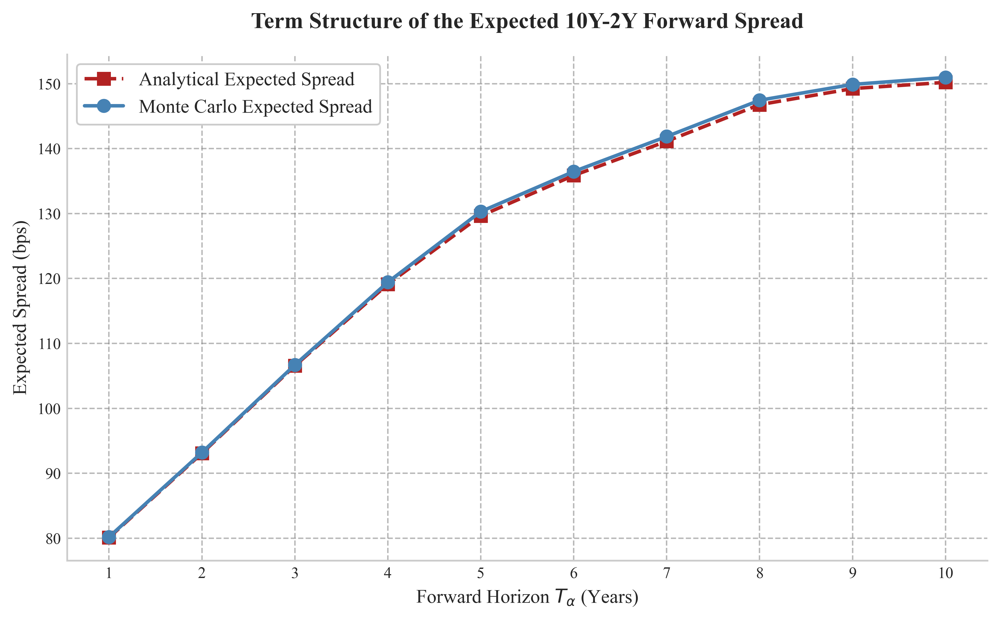


COPY AND PASTE THE LATEX CODE BELOW INTO YOUR THESIS:

\begin{table}[h!]
\centering
\renewcommand{\arraystretch}{1.2}
\begin{tabular}{l r r r}
\toprule
\textbf{Horizon ($T_\alpha$)} & \textbf{Analytical (bps)} & \textbf{MC Expected (bps)} & \textbf{Difference (bps)} \\
\midrule
1 Year & 80.08 & 80.18 & 0.09 \\
2 Year & 93.08 & 93.20 & 0.12 \\
3 Year & 106.56 & 106.69 & 0.13 \\
4 Year & 119.12 & 119.43 & 0.31 \\
5 Year & 129.65 & 130.30 & 0.65 \\
6 Year & 135.87 & 136.48 & 0.61 \\
7 Year & 141.13 & 141.87 & 0.73 \\
8 Year & 146.77 & 147.46 & 0.68 \\
9 Year & 149.25 & 149.89 & 0.64 \\
10 Year & 150.21 & 150.96 & 0.75 \\
\bottomrule
\end{tabular}
\caption{Comparison of the expected 10Y-2Y forward spread term structure. The analytical model calculates a deterministic expectation based on the initial yield curve's roll-down, whereas the Monte Carlo engine captures the full path-dependent drift of the underlying swap rates over the simulation horizon. The expanding difference highlights the

In [62]:
# =====================================================================
# 3. GENERATE PUBLICATION-READY PLOT
# =====================================================================
fig, ax = plt.subplots(figsize=(8, 5), dpi=500)

ax.plot(t_alphas, ana_spreads_bps, marker='s', markersize=7, linestyle='--', 
        color='firebrick', linewidth=2, label='Analytical Expected Spread')

ax.plot(t_alphas, mc_spreads_bps, marker='o', markersize=7, linestyle='-', 
        color='steelblue', linewidth=2, label='Monte Carlo Expected Spread')

# Formatting
ax.set_title("Term Structure of the Expected 10Y-2Y Forward Spread", fontsize=13, fontweight='bold', pad=15)
ax.set_xlabel("Forward Horizon $T_{\\alpha}$ (Years)", fontsize=11)
ax.set_ylabel("Expected Spread (bps)", fontsize=11)

# Fix the X-axis to show clean integers
ax.set_xticks(t_alphas)
ax.set_xticklabels([f"{int(round(t))}" for t in t_alphas]) # Rounds 1.014 down to "1"

ax.grid(True, linestyle='--', alpha=0.6)

# Force the legend to have an opaque white background
ax.legend(loc='upper left', fontsize=11, frameon=True, framealpha=1.0, facecolor='white', edgecolor='0.8')

plt.tight_layout()
plt.savefig('expected_spread_comparison_long.pdf', bbox_inches='tight', dpi=500)
plt.show()

# =====================================================================
# 4. GENERATE LATEX TABLE
# =====================================================================
print("\n" + "="*70)
print("COPY AND PASTE THE LATEX CODE BELOW INTO YOUR THESIS:")
print("="*70 + "\n")

latex_str = r"""\begin{table}[h!]
\centering
\renewcommand{\arraystretch}{1.2}
\begin{tabular}{l r r r}
\toprule
\textbf{Horizon ($T_\alpha$)} & \textbf{Analytical (bps)} & \textbf{MC Expected (bps)} & \textbf{Difference (bps)} \\
\midrule
"""

for T, ana, mc, diff in latex_data:
    # Use round() so 1.014 correctly displays as 1 in the table
    latex_str += f"{int(round(T))} Year & {ana:.2f} & {mc:.2f} & {diff:.2f} \\\\\n"

latex_str += r"""\bottomrule
\end{tabular}
\caption{Comparison of the expected 10Y-2Y forward spread term structure. The analytical model calculates a deterministic expectation based on the initial yield curve's roll-down, whereas the Monte Carlo engine captures the full path-dependent drift of the underlying swap rates over the simulation horizon. The expanding difference highlights the divergence of the models across longer maturities.}
\label{tab:expected_spread_comparison}
\end{table}"""

print(latex_str)

In [57]:
import numpy as np
import matplotlib.pyplot as plt

# =====================================================================
# 1. SETUP MASTER MATRIX PARAMETERS
# =====================================================================
# Select a grid that fits cleanly on a printed page
expiries_to_test = ['1YR', '2YR','3YR','4YR',  '5YR','6YR', '7YR','8YR','9YR','10YR']
strikes_bps = [-25,0, 25, 50, 75, 100]
num_paths = 100000

# Initialize the storage matrix (Rows = Strikes, Cols = Expiries)
mc_matrix = np.zeros((len(strikes_bps), len(expiries_to_test)))
t_alphas = []

print("Generating Master Pricing Matrix (Monte Carlo Premiums in bps)...\n")

# =====================================================================
# 2. RUN NESTED PRICING LOOPS
# =====================================================================
for j, exp_lbl in enumerate(expiries_to_test):
    cell_10Y = detailed_results[(exp_lbl, '10YR')]
    cell_2Y  = detailed_results[(exp_lbl, '2YR')]
    
    T_expiry = cell_10Y['T_alpha']
    t_alphas.append(int(round(T_expiry)))
    
    steps_per_year = 100
    total_steps = int(np.ceil(T_expiry * steps_per_year))
    
    print(f"--- Computing Expiry: {exp_lbl} ---")
    
    for i, K_bps in enumerate(strikes_bps):
        K_decimal = K_bps / 10000.0
        
        # Run Monte Carlo Engine
        mc_price_dec, _, _ = run_hjm_monte_carlo(
            kappa=kappa_calib, sigma=sigma_calib, T_expiry=T_expiry,
            T_10Y_cashflows=cell_10Y['T_coupons'], tau_10Y=cell_10Y['tau_coupons'],
            T_2Y_cashflows=cell_2Y['T_coupons'], tau_2Y=cell_2Y['tau_coupons'],
            P_0_func=market_P_0, f_0_func=market_f_0, 
            strike=K_decimal, num_paths=num_paths, num_steps=total_steps, 
            discount_method='trapezoidal'
        )
        
        mc_pv_bps = mc_price_dec * 10000.0
        mc_matrix[i, j] = mc_pv_bps
        
        print(f"Strike: {K_bps:>3} bps | PV: {mc_pv_bps:>6.2f} bps")
    print("")

Generating Master Pricing Matrix (Monte Carlo Premiums in bps)...

--- Computing Expiry: 1YR ---
Strike: -25 bps | PV: 103.83 bps
Strike:   0 bps | PV:  79.69 bps
Strike:  25 bps | PV:  56.62 bps
Strike:  50 bps | PV:  36.17 bps
Strike:  75 bps | PV:  20.12 bps
Strike: 100 bps | PV:   9.49 bps

--- Computing Expiry: 2YR ---
Strike: -25 bps | PV: 116.12 bps
Strike:   0 bps | PV:  92.91 bps
Strike:  25 bps | PV:  70.88 bps
Strike:  50 bps | PV:  50.97 bps
Strike:  75 bps | PV:  34.16 bps
Strike: 100 bps | PV:  21.13 bps

--- Computing Expiry: 3YR ---
Strike: -25 bps | PV: 128.83 bps
Strike:   0 bps | PV: 106.27 bps
Strike:  25 bps | PV:  84.75 bps
Strike:  50 bps | PV:  64.90 bps
Strike:  75 bps | PV:  47.40 bps
Strike: 100 bps | PV:  32.86 bps

--- Computing Expiry: 4YR ---
Strike: -25 bps | PV: 140.59 bps
Strike:   0 bps | PV: 118.56 bps
Strike:  25 bps | PV:  97.39 bps
Strike:  50 bps | PV:  77.58 bps
Strike:  75 bps | PV:  59.68 bps
Strike: 100 bps | PV:  44.17 bps

--- Computing Exp

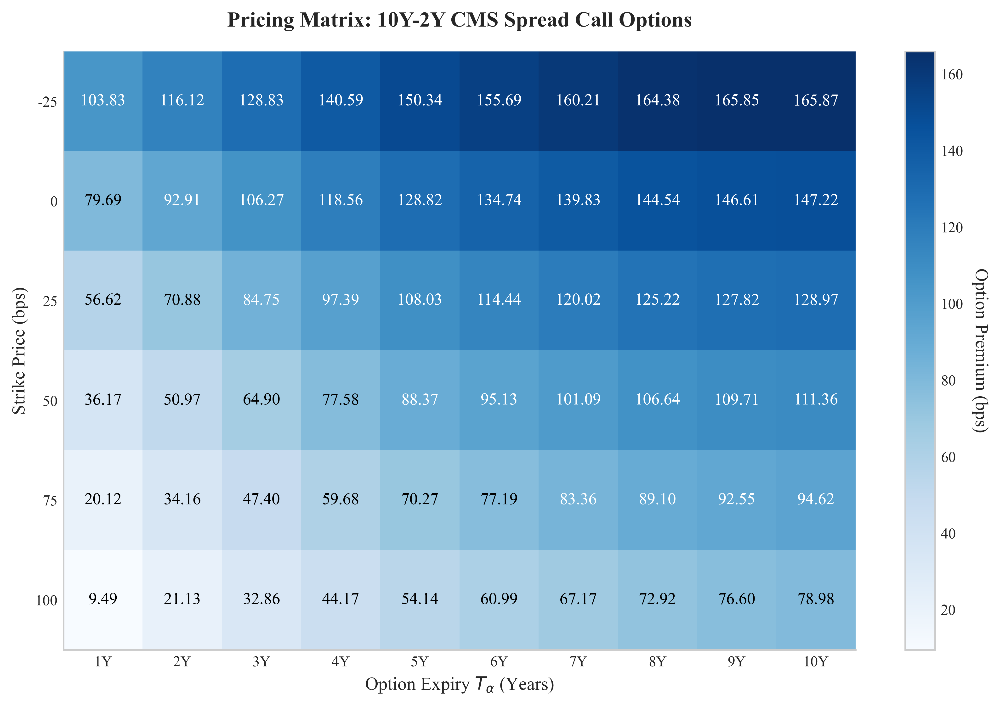

COPY AND PASTE THE LATEX CODE BELOW INTO YOUR THESIS:

\begin{table}[h!]
\centering
\renewcommand{\arraystretch}{1.3}
\begin{tabular}{r r r r r r r r r r r}
\toprule
\textbf{Strike} & \textbf{1 Year} & \textbf{2 Year} & \textbf{3 Year} & \textbf{4 Year} & \textbf{5 Year} & \textbf{6 Year} & \textbf{7 Year} & \textbf{8 Year} & \textbf{9 Year} & \textbf{10 Year} \\
\midrule
-25 bps & 103.83 & 116.12 & 128.83 & 140.59 & 150.34 & 155.69 & 160.21 & 164.38 & 165.85 & 165.87 \\
0 bps & 79.69 & 92.91 & 106.27 & 118.56 & 128.82 & 134.74 & 139.83 & 144.54 & 146.61 & 147.22 \\
25 bps & 56.62 & 70.88 & 84.75 & 97.39 & 108.03 & 114.44 & 120.02 & 125.22 & 127.82 & 128.97 \\
50 bps & 36.17 & 50.97 & 64.90 & 77.58 & 88.37 & 95.13 & 101.09 & 106.64 & 109.71 & 111.36 \\
75 bps & 20.12 & 34.16 & 47.40 & 59.68 & 70.27 & 77.19 & 83.36 & 89.10 & 92.55 & 94.62 \\
100 bps & 9.49 & 21.13 & 32.86 & 44.17 & 54.14 & 60.99 & 67.17 & 72.92 & 76.60 & 78.98 \\
\bottomrule
\end{tabular}
\caption{Master pricing matrix 

In [58]:
# =====================================================================
# 3. GENERATE PUBLICATION-READY HEATMAP
# =====================================================================
fig, ax = plt.subplots(figsize=(9, 6), dpi=500)

# Create heatmap (using the Blues colormap for academic neutrality)
cax = ax.imshow(mc_matrix, cmap='Blues', aspect='auto')

# Add colorbar
cbar = fig.colorbar(cax, ax=ax)
cbar.set_label('Option Premium (bps)', rotation=270, labelpad=15, fontsize=11)

# Format axes
ax.set_xticks(np.arange(len(expiries_to_test)))
ax.set_yticks(np.arange(len(strikes_bps)))
ax.set_xticklabels([f"{t}Y" for t in t_alphas])
ax.set_yticklabels(strikes_bps)

ax.set_xlabel("Option Expiry $T_\\alpha$ (Years)", fontsize=11)
ax.set_ylabel("Strike Price (bps)", fontsize=11)
ax.set_title("Pricing Matrix: 10Y-2Y CMS Spread Call Options", fontsize=13, fontweight='bold', pad=15)

ax.grid(False)

# Annotate each cell with the exact numerical value
for i in range(len(strikes_bps)):
    for j in range(len(expiries_to_test)):
        # Determine text color based on background intensity for readability
        cell_val = mc_matrix[i, j]
        text_color = "white" if cell_val > (np.max(mc_matrix) * 0.5) else "black"
        ax.text(j, i, f"{cell_val:.2f}", ha="center", va="center", color=text_color, fontsize=10)

plt.tight_layout()
plt.savefig('cms_pricing_heatmap.pdf', bbox_inches='tight', dpi = 500)
plt.show()

# =====================================================================
# 4. GENERATE LATEX TABLE
# =====================================================================
print("="*70)
print("COPY AND PASTE THE LATEX CODE BELOW INTO YOUR THESIS:")
print("="*70 + "\n")

# Dynamically construct the column format string (e.g., 'r r r r r r')
col_format = "r " + " ".join(["r"] * len(expiries_to_test))

latex_str = f"""\\begin{{table}}[h!]
\\centering
\\renewcommand{{\\arraystretch}}{{1.3}}
\\begin{{tabular}}{{{col_format}}}
\\toprule
"""

# Header row
header_cols = ["\\textbf{Strike}"] + [f"\\textbf{{{t} Year}}" for t in t_alphas]
latex_str += " & ".join(header_cols) + " \\\\\n\\midrule\n"

# Data rows
for i, K_bps in enumerate(strikes_bps):
    row_str = f"{K_bps} bps"
    for j in range(len(expiries_to_test)):
        row_str += f" & {mc_matrix[i, j]:.2f}"
    row_str += " \\\\\n"
    latex_str += row_str

latex_str += r"""\bottomrule
\end{tabular}
\caption{Master pricing matrix detailing Monte Carlo expected premiums (in bps) for a 10Y-2Y CMS spread call option across the primary term structure and strike spectrum. Premiums rise monotonically with expiration horizon and decay identically as strikes move further out-of-the-money.}
\label{tab:master_pricing_matrix}
\end{table}"""

print(latex_str)

# PCA

In [14]:
df_hist = pd.read_csv('estr.csv',index_col=0)
df_hist.columns = df['Tenor']
df_hist.index = pd.to_datetime(df_hist.index)

In [15]:
cols = ['1WK', '2MO', '6MO', '1YR', '2YR', '10YR', '30YR']

df_hist[cols].describe().loc[['count', 'mean', 'std', 'min', '50%', 'max']].round(4)

Tenor,1WK,2MO,6MO,1YR,2YR,10YR,30YR
count,1648.0000,1646.0000,1645.0000,1646.0000,1644.0000,1637.0000,1631.0000
mean,1.3527,1.3816,1.4189,1.4223,1.3700,1.5613,1.6346
std,1.7626,1.7552,1.7238,1.6629,1.5314,1.3121,1.1700
min,-0.6122,-0.6650,-0.7130,-0.7570,-0.7980,-0.6144,-0.4710
50%,1.9238,1.9240,1.8960,1.8762,1.8830,2.3242,2.2353
max,3.9110,3.9210,3.9740,3.9378,3.7158,3.3182,3.1920


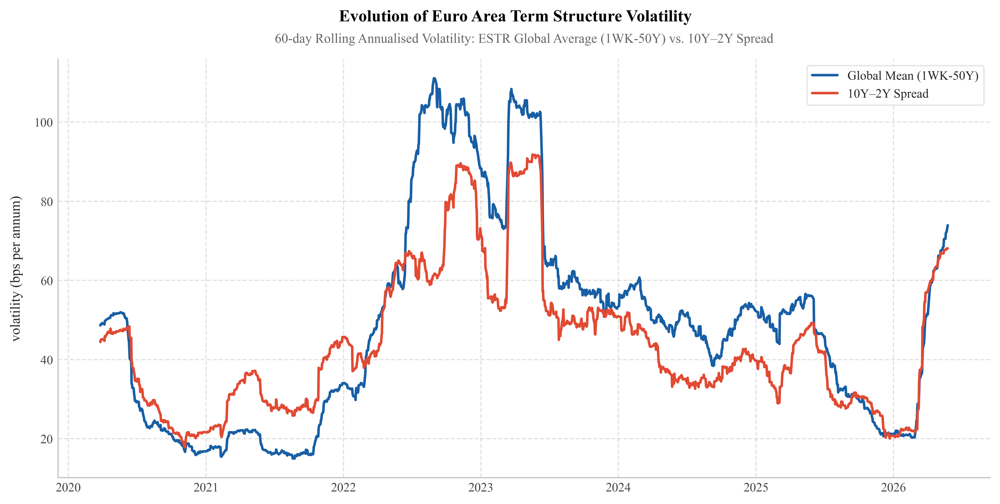

In [17]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# 1. Compute Global Curve Volatility (Cross-sectional mean)
df_rates_vol = df_hist.diff().dropna().rolling(window=60).std() * np.sqrt(252)
curve_vol_bps = df_rates_vol.T.mean() * 100.0

# 2. Compute 10Y-2Y Spread Volatility
spread_series = df_hist.eval('`10YR` - `2YR`')
spread_vol_bps = spread_series.diff().dropna().rolling(window=60).std() * np.sqrt(252) * 100.0

# 3. Initialize the dual-line canvas
fig, ax = plt.subplots(figsize=(10, 5.5), dpi=500)

# 4. Plot both series with clear visual contrast
ax.plot(curve_vol_bps.index, curve_vol_bps.values, 
        color='#185FA5', lw=1.8, label='Global Mean (1WK-50Y)')

ax.plot(spread_vol_bps.index, spread_vol_bps.values, 
        color='#E24A33', lw=1.8, linestyle='-', label='10Y–2Y Spread')

# 5. Professional Typography Hierarchy (Title + Subtitle)
fig.suptitle("Evolution of Euro Area Term Structure Volatility", 
             fontsize=12, fontweight='bold', color='black', x=0.515, y=0.9)

ax.set_title("60-day Rolling Annualised Volatility: ESTR Global Average (1WK-50Y) vs. 10Y–2Y Spread", 
             fontsize=9.5, color='#666666', pad=12, loc='center')

# ax.set_xlabel("Timeline", fontsize=10, labelpad=8)
ax.set_ylabel("volatility (bps per annum)", fontsize=10, labelpad=8)

# 6. Elegant Legend Placement (Clean frame, positioned inside the blank space)
ax.legend(loc='upper right', frameon=True, facecolor='white', edgecolor='#e0e0e0', fontsize=9)

# 7. Despine Geometry (Removes heavy top/right chart borders)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
    
ax.spines['left'].set_color('#cccccc')
ax.spines['bottom'].set_color('#cccccc')

# 8. Add subtle background grid lines
ax.grid(True, linestyle='--', alpha=0.3, color='#999999')

# 9. Smart X-Axis Time-Series Formatting
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=3))

ax.tick_params(axis='both', which='major', labelsize=9, colors='#444444')

# 10. Adjust margins to guarantee titles never clip or collide
plt.tight_layout(rect=[0, 0, 1, 0.94])
plt.savefig('comparative_yield_curve_volatility.pdf', bbox_inches='tight', dpi=500)
plt.show()

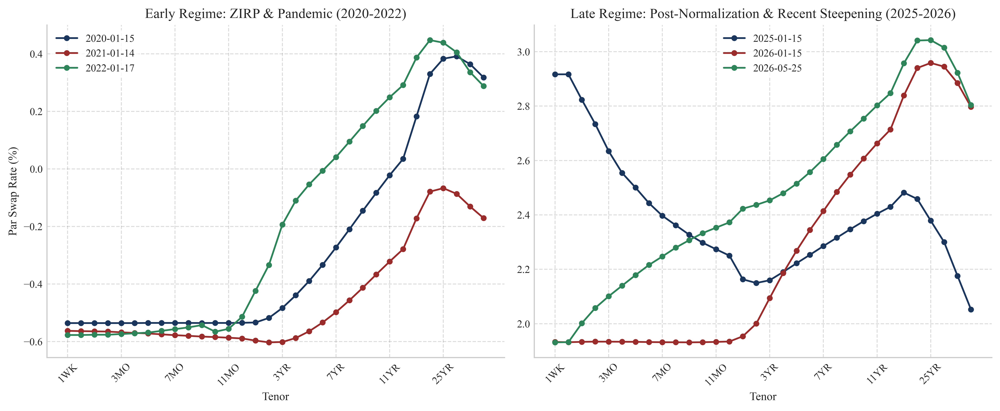

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Convert string dates to Datetime objects (assuming df_hist.index is DatetimeIndex)
dates_early = ['2020-01-15', '2021-01-14', '2022-01-17']
dates_late  = ['2025-01-15', '2026-01-15', '2026-05-25']

# 2. Set up the side-by-side figure (Golden ratio-ish for two columns)
fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=500)

# --- Plot 1: Early Regime ---
df_hist.loc[dates_early].T.plot(ax=axes[0], marker='o', markersize=4, linewidth=1.5)

axes[0].set_title('Early Regime: ZIRP & Pandemic (2020-2022)')
axes[0].set_ylabel('Par Swap Rate (%)')
axes[0].set_xlabel('Tenor')
axes[0].grid(True, alpha=0.3, linestyle='--')

# Clean up x-ticks (Show every 4th tenor to avoid crowding)
tenors = df_hist.columns
axes[0].set_xticks(range(0, len(tenors), 4))
axes[0].set_xticklabels(tenors[::4], rotation=45)

# Format legend to just show YYYY-MM-DD (stripping out 00:00:00 timestamps)
axes[0].legend(dates_early, frameon=True, facecolor='white', edgecolor='none')

# --- Plot 2: Late Regime ---
df_hist.loc[dates_late].T.plot(ax=axes[1], marker='o', markersize=4, linewidth=1.5)

axes[1].set_title('Late Regime: Post-Normalization & Recent Steepening (2025-2026)')
axes[1].set_xlabel('Tenor')
axes[1].grid(True, alpha=0.3, linestyle='--')

# Clean up x-ticks identically
axes[1].set_xticks(range(0, len(tenors), 4))
axes[1].set_xticklabels(tenors[::4], rotation=45)

axes[1].legend(dates_late, frameon=True, facecolor='white', edgecolor='none')

# --- Global Formatting ---
# Remove top and right borders for the academic aesthetic
for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()

# Save as vector graphic for LaTeX
plt.savefig("historical_yield_curves.pdf", format="pdf", dpi=300, bbox_inches='tight')
plt.show()

In [20]:
import pandas as pd

def clean_historical_data_for_pca(df_hist):
    """
    Cleans historical OIS quotes for PCA by handling business days, 
    forward-filling missing quotes, and computing stationary differences.
    """
    # 1. Ensure index is a proper datetime format and sort chronologically
    df_clean = df_hist.copy()
    df_clean.index = pd.to_datetime(df_clean.index)
    df_clean = df_clean.sort_index()
    
    # 2. Forward fill missing values (prevent look-ahead bias)
    df_clean = df_clean.ffill().bfill()
    
    # 3. Calculate daily changes (basis points or absolute rate differences)
    # PCA requires stationary data. Raw rates are non-stationary.
    df_diff = df_clean.diff()
    
    # 4. Drop the first row (which is now NaN due to differencing)
    df_diff = df_diff.dropna()
    
    return df_diff


df_pca_ready = clean_historical_data_for_pca(df_hist)

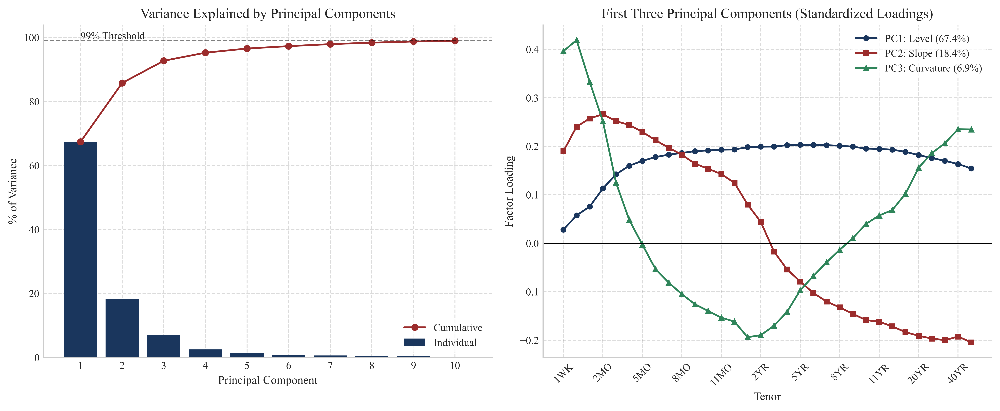

In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

def run_yield_curve_pca(df_hist):
    """
    Performs Principal Component Analysis (PCA) on historical yield curve data
    and generates a publication-ready figure.
    """
    
    # 1. Calculate Daily Changes
    df_diff = df_hist.diff().dropna()
    
    # 2. Standardize the Data (Correlation-based PCA)
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(df_diff)
    
    # 3. Fit the PCA
    num_components = min(10, data_scaled.shape[1])
    pca = PCA(n_components=num_components)
    pca.fit(data_scaled)
    
    # 4. Extract Variance Metrics
    explained_var = pca.explained_variance_ratio_ * 100
    cum_explained_var = np.cumsum(explained_var)
    
    eigenvectors = pca.components_
    
    # =========================================================
    # ACADEMIC VISUALIZATION
    # =========================================================
    # Professional color palette: Slate Blue, Muted Crimson, Sage Green
    color_pc1 = '#1a365d'
    color_pc2 = '#9b2c2c'
    color_pc3 = '#2f855a'
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=500)
    
    # --- Plot 1: Scree Plot (Explained Variance) ---
    axes[0].bar(range(1, num_components + 1), explained_var, alpha=1, color=color_pc1, label='Individual')
    axes[0].plot(range(1, num_components + 1), cum_explained_var, marker='o', color=color_pc2, markersize=5, lw=1.5, label='Cumulative')
    axes[0].axhline(y=99.0, color='black', linestyle='--', lw=1, alpha=0.5)
    axes[0].text(1, 99.5, '99% Threshold', fontsize=9)
    
    axes[0].set_title('Variance Explained by Principal Components')
    axes[0].set_xlabel('Principal Component')
    axes[0].set_ylabel('% of Variance')
    axes[0].set_xticks(range(1, num_components + 1))
    axes[0].legend(frameon=True, facecolor='white', edgecolor='none')
    
    # --- Plot 2: Factor Loadings (Level, Slope, Curvature) ---
    tenor_labels = df_hist.columns
    
    axes[1].plot(tenor_labels, eigenvectors[0], marker='o', color=color_pc1, markersize=4, lw=1.5, label=f'PC1: Level ({explained_var[0]:.1f}%)')
    axes[1].plot(tenor_labels, eigenvectors[1], marker='s', color=color_pc2, markersize=4, lw=1.5, label=f'PC2: Slope ({explained_var[1]:.1f}%)')
    axes[1].plot(tenor_labels, eigenvectors[2], marker='^', color=color_pc3, markersize=4, lw=1.5, label=f'PC3: Curvature ({explained_var[2]:.1f}%)')
    
    axes[1].axhline(y=0, color='black', linestyle='-', lw=1)
    axes[1].set_title('First Three Principal Components (Standardized Loadings)')
    axes[1].set_xlabel('Tenor')
    axes[1].set_ylabel('Factor Loading')
    
    # Clean up x-axis ticks 
    axes[1].set_xticks(range(0, len(tenor_labels), 3))
    axes[1].tick_params(axis='x', rotation=45)
    axes[1].legend(frameon=True, facecolor='white', edgecolor='none')
    
    # --- Global Formatting (Academic Style) ---
    for ax in axes:
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
    
    plt.tight_layout()
    plt.savefig("pca_factor_analysis.pdf", format="pdf", dpi=300, bbox_inches='tight')
    plt.show()

# Execution 
run_yield_curve_pca(df_pca_ready)

# Rest

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure the academic style function from earlier is loaded!
# set_academic_style()

def plot_swaption_heatmap(market_bachelier_raw):
    """
    Generates a publication-ready heatmap of the Swaption Volatility Matrix.
    Assumes market_bachelier_raw contains values in basis points (e.g., 150, 300).
    """
    # Create the figure with golden ratio proportions
    fig, ax = plt.subplots(figsize=(8, 5), dpi=500)
    
    # Choose an academic sequential colormap
    # 'YlOrRd' (Yellow-Orange-Red) is standard for volatility/heat
    # 'rocket_r' or 'mako_r' (from seaborn) are also highly professional
    cmap = sns.color_palette("viridis_r", as_cmap=True)
    
    # Generate the heatmap
    # annot=True prints the numbers. fmt=".0f" removes decimals (since they are in bps)
    sns.heatmap(market_bachelier_raw, 
                annot=True, 
                fmt=".0f", 
                cmap=cmap, 
                linewidths=0.5,      # Adds subtle gridlines between cells
                linecolor='white', 
                cbar_kws={'label': 'Normal Implied Volatility (bps)'},
                ax=ax)
    
    # Format the labels
    ax.set_title("EUR ATM Swaption Normal Implied Volatility", fontweight='bold', pad=15)
    ax.set_xlabel("Underlying Swap Tenor", labelpad=10)
    ax.set_ylabel("Option Expiry", labelpad=10)
    
    # Rotate x-axis labels to be horizontal (default is sometimes vertical)
    plt.xticks(rotation=0)
    plt.yticks(rotation=0)
    
    # Tight layout and save as vector graphic for LaTeX
    plt.tight_layout()
    plt.savefig("swaption_vol_heatmap.pdf", format="pdf", dpi=300, bbox_inches='tight')
    plt.show()

# Usage:
# market_bachelier_raw = df # Your 10x6 matrix BEFORE dividing by 10000
plot_swaption_heatmap(market_bachelier_raw)

NameError: name 'market_bachelier_raw' is not defined